# Insurance Claim Fraud Detection


Project Description
Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.
In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 
In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

Independent Variables
1.	months_as_customer: Number of months of patronage
2.	age: the length of time a customer has lived or a thing has existed
3.	policy_number: It is a unique id given to the customer, to track the subscription status and other details of customer
4.	policy_bind_date:date which document that is given to customer after we accept your proposal for insurance
5.	policy_state: This identifies who is the insured, what risks or property are covered, the policy limits, and the policy period
6.	policy_csl: is basically Combined Single Limit
7.	policy_deductable: the amount of money that a customer is responsible for paying toward an insured loss
8.	policy_annual_premium: This means the amount of Regular Premium payable by the Policyholder in a Policy Year
9.	umbrella_limit: This means extra insurance that provides protection beyond existing limits and coverages of other policies
10.	insured_zip: It is the zip code where the insurance was made
11.	insured_sex: This refres to either of the two main categories (male and female) into which customer are divided on the basis of their reproductive functions
12.	insured_education_level: This refers to the Level of education of the customer
13.	insured_occupation: This refers Occupation of the customer
14.	insured_hobbies: This refers to an activity done regularly by customer in his/her leisure time for pleasure.
15.	insured_relationship: This whether customer is: single; or. married; or. in a de facto relationship (that is, living together but not married); or. in a civil partnership
16.	capital-gains: This refers to profit accrued due to insurance premium
17.	capital-loss: This refers to the losses incurred due to insurance claims
18.	incident_date: This refers to the date which claims where made by customers
19.	incident_type: This refers to the type of claim/vehicle damage made by customer
20.	collision_type: This refers to the area of damage on the vehicle
21.	incident_severity: This refers to the extent/level of damage
22.	authorities_contacted: This refers to the government agencies that were contacted after damage
23.	incident_state: This refers to the state at which the accident happened
24.	incident_city: This refers to the city at which the accident happened
25.	1ncident_location: This refers to the location at which the accident happened
26.	incident_hour_of_the_day: The period of the day which accident took place
27.	number_of_vehicles_involved: This refers to number of vehicles involved the accident
28.	property_damage: This refers to whether property was damaged or not
29.	bodily_injuries: This refers to injuries sustained
30.	witnesses: This refers to the number of witnesses involved
31.	police_report_available: This refers to whether the report on damage was documented or not
32.	total_claim_amount: This refers to the financial implications involved in claims
33.	injury_claim: This refers to physical injuries sustained
34.	property_claim: This refers to property damages during incident
35.	vehicle_claim: This refers to property damages during incident
36.	auto_make: This refers to the make of the vehicle
37.	auto_model: This refers to the model of the vehicle
38.	auto_year: This refers to the year which the vehicle was manufactured
39.	_c39:
40.	fraud_reported

Dataset Link-  
https://github.com/dsrscientist/Data-Science-ML-Capstone-Projects/blob/master/Automobile_insurance_fraud.csv 


In [1]:
#Importing the Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import zipfile
warnings.filterwarnings('ignore')



In [2]:
#Retrieving the data
url="https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/refs/heads/master/Automobile_insurance_fraud.csv"
df=pd.read_csv(url)
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [3]:
def show_percentage(ax, total):
    ''' Shows the representative percentage in each bar in a countplot.'''
    for p in ax.patches:
        percentage = f"{100 * p.get_height()/total:.1f} %"
        x = p.get_x() + p.get_width() / 2 - 0.02
        y = p.get_height()
        ax.annotate(percentage, (x, y), fontsize=10, ha='center')

In [5]:
df.shape

(1000, 40)

The dataset consists of 1000 rows and 40 columns.

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

The dataset consists of three types of data, they are float, integer and object.

In [8]:
# List object variables
object_vars = df.select_dtypes(include='object').columns.tolist()
print(f"Object/Categorical variables:\n{object_vars}\n")

# List int64 variables
int_vars = df.select_dtypes(include='int64').columns.tolist()
print(f"int variables:\n{int_vars}\n")

# List float64 variables
float_vars = df.select_dtypes(include='float64').columns.tolist()
print(f"float variables:\n{float_vars}")


Object/Categorical variables:
['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']

int variables:
['months_as_customer', 'age', 'policy_number', 'policy_deductable', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year']

float variables:
['policy_annual_premium', '_c39']


In [10]:
#Missing Values
# checking the null values
missing_val = df.isnull().sum().to_frame("Null values")
missing_val

,Null values
months_as_customer,0
age,0
policy_number,0
policy_bind_date,0
policy_state,0
policy_csl,0
policy_deductable,0
policy_annual_premium,0
umbrella_limit,0
insured_zip,0


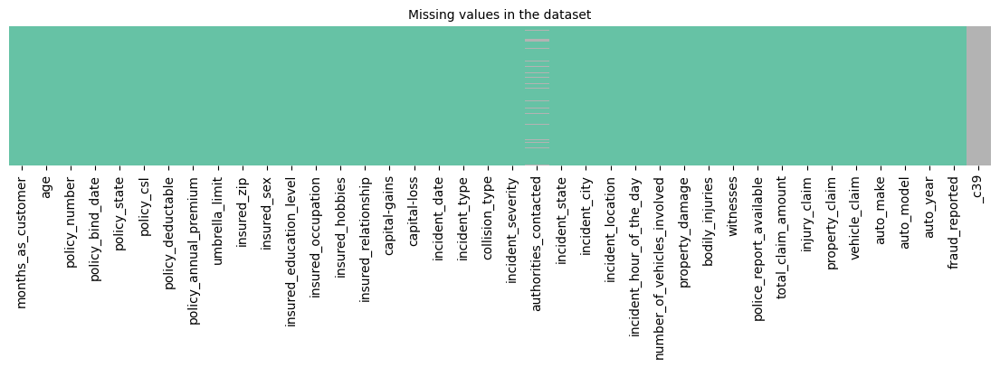

In [11]:
# Let's visualize it using heatmap for dataset
plt.figure(figsize=(14,2))
sns.heatmap(df.isnull(), yticklabels=False, cmap='Set2', cbar=False)
plt.title('Missing values in the dataset', fontsize=10);

In [12]:
#Dropping the null values
df.drop('_c39', axis=1, inplace= True)

In [14]:
print(f"The dataset presents {df.isnull().sum()} missing values.")

The dataset presents months_as_customer              0
age                             0
policy_number                   0
policy_bind_date                0
policy_state                    0
policy_csl                      0
policy_deductable               0
policy_annual_premium           0
umbrella_limit                  0
insured_zip                     0
insured_sex                     0
insured_education_level         0
insured_occupation              0
insured_hobbies                 0
insured_relationship            0
capital-gains                   0
capital-loss                    0
incident_date                   0
incident_type                   0
collision_type                  0
incident_severity               0
authorities_contacted          91
incident_state                  0
incident_city                   0
incident_location               0
incident_hour_of_the_day        0
number_of_vehicles_involved     0
property_damage                 0
bodily_injuries            

In [15]:
df['authorities_contacted'].head()

0    Police
1    Police
2    Police
3    Police
4       NaN
Name: authorities_contacted, dtype: object

In [29]:
values = {'authorities_contacted':'Police'}
df.fillna(value=values,inplace=True)

In [30]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

In [31]:
#Unique Values
# Reviewing the number of unique values in each feature and the target
info_df = df.nunique().to_frame('No. of Unique values')
info_df['type'] = df.dtypes.values

info_df

,No. of Unique values,type
months_as_customer,391,int64
age,46,int64
policy_number,1000,int64
policy_bind_date,951,object
policy_state,3,object
policy_csl,3,object
policy_deductable,3,int64
policy_annual_premium,991,float64
umbrella_limit,11,int64
insured_zip,995,int64


In [33]:
# Checking insured_zip column
df['insured_zip'].value_counts()


insured_zip
477695    2
469429    2
446895    2
431202    2
456602    2
         ..
476303    1
450339    1
476502    1
600561    1
612260    1
Name: count, Length: 995, dtype: int64

In [34]:
df[['policy_number', 'incident_location', 'insured_zip']].sample(5)

,policy_number,incident_location,insured_zip
410,631565,1512 Rock Lane,457722
861,489618,1880 Weaver Drive,452438
707,626208,4876 Washington Drive,613607
329,414519,1507 Solo Ave,457535
761,648852,6668 Andromedia Ridge,604948


Regarding the number of unique values in the dataset:

The policy_number and incident_location columns have the same unique values as the dataset rows. These columns solely serve to identify each record and do not influence the target variable. Therefore, they can be dropped.

The insured_zip represents the zip code where the insurance was made. Since it nearly mirrors the number of rows in the dataset, this feature does not provide valuable information for the prediction model and can be dropped as well.

In [35]:
# Dropping the columns policy_number and incident_location
df.drop(['policy_number', 'incident_location', 'insured_zip'], axis=1, inplace=True)
display(df.sample(5))

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
521,5,26,27-07-2014,IL,250/500,2000,1137.02,0,FEMALE,PhD,...,3,?,88110,16020,16020,56070,Audi,A5,2003,N
595,56,36,08-11-2009,IN,100/300,500,1533.07,0,MALE,JD,...,2,YES,58500,0,6500,52000,Ford,Escape,2001,N
59,151,36,26-02-2005,OH,250/500,2000,870.63,0,FEMALE,MD,...,1,NO,62920,11440,5720,45760,Ford,Escape,2000,N
354,77,27,07-04-1999,IN,500/1000,2000,966.26,0,FEMALE,High School,...,0,?,67200,6720,6720,53760,Volkswagen,Passat,1995,N
181,426,54,24-10-1997,IL,500/1000,2000,1097.71,0,FEMALE,Masters,...,3,?,100800,16800,16800,67200,Dodge,Neon,1997,N


In [36]:
# checking the new dimension of the dataset
print(f"The rows and columns in the dataset: {df.shape}")

The rows and columns in the dataset: (1000, 36)


In [37]:
# Checking the target variable
df['fraud_reported'].value_counts().to_frame()

,count
fraud_reported,
N,753
Y,247


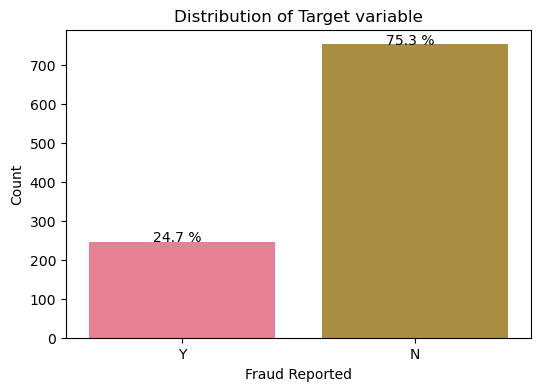

In [39]:
# Visualize the distribution of fraud_reported
col = 'fraud_reported'
plt.figure(figsize=(6, 4))
sns.set_palette('husl')
ax = sns.countplot(data=df, x=col)
show_percentage(ax, len(df))
plt.title('Distribution of Target variable')
plt.xlabel('Fraud Reported')
plt.ylabel('Count')
plt.show()

And we can observe the dataset is imbalanced. There are significantly more records(75.3%) for "N" compared to 24.7% for "Y". We will rectify it by using the oversampling method in the later part.



In [40]:
df.nunique()

months_as_customer             391
age                             46
policy_bind_date               951
policy_state                     3
policy_csl                       3
policy_deductable                3
policy_annual_premium          991
umbrella_limit                  11
insured_sex                      2
insured_education_level          7
insured_occupation              14
insured_hobbies                 20
insured_relationship             6
capital-gains                  338
capital-loss                   354
incident_date                   60
incident_type                    4
collision_type                   4
incident_severity                4
authorities_contacted            4
incident_state                   7
incident_city                    7
incident_hour_of_the_day        24
number_of_vehicles_involved      4
property_damage                  3
bodily_injuries                  3
witnesses                        4
police_report_available          3
total_claim_amount  

In [44]:
# Separating Numerical and Categorical columns
categorical_col =  df.select_dtypes(include='object').columns.tolist()
num_cat_col = ['policy_deductable', 'bodily_injuries', 'witnesses', 'number_of_vehicles_involved', 'umbrella_limit', 'auto_year', 'incident_hour_of_the_day', 'age']
numerical_col =  [col for col in df.select_dtypes(include=np.number).columns.tolist() if col not in num_cat_col]

#  Numerical and Categorical columns
print(f"Categorical Columns:\n {categorical_col}\n")
print(f"Numerical Columns that represent a category:\n {num_cat_col}\n")
print(f"Numerical Columns:\n {numerical_col}\n")

Categorical Columns:
 ['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']

Numerical Columns that represent a category:
 ['policy_deductable', 'bodily_injuries', 'witnesses', 'number_of_vehicles_involved', 'umbrella_limit', 'auto_year', 'incident_hour_of_the_day', 'age']

Numerical Columns:
 ['months_as_customer', 'policy_annual_premium', 'capital-gains', 'capital-loss', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']



In [45]:

# Checking the value counts of the numerical independent variables
for i, col in enumerate(numerical_col):
    print(f"{i+1}. {col}:\n{df[col].value_counts()}")
    print(f"No. uniques values: {df[col].nunique()}\n")


1. months_as_customer:
months_as_customer
194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: count, Length: 391, dtype: int64
No. uniques values: 391

2. policy_annual_premium:
policy_annual_premium
1558.29    2
1215.36    2
1362.87    2
1073.83    2
1389.13    2
          ..
1085.03    1
1437.33    1
988.29     1
1238.89    1
766.19     1
Name: count, Length: 991, dtype: int64
No. uniques values: 991

3. capital-gains:
capital-gains
0        508
46300      5
51500      4
68500      4
55600      3
        ... 
36700      1
54900      1
69200      1
48800      1
50300      1
Name: count, Length: 338, dtype: int64
No. uniques values: 338

4. capital-loss:
capital-loss
 0        475
-31700      5
-53700      5
-50300      5
-45300      4
         ... 
-12100      1
-17000      1
-72900      1
-19700      1
-82100      1
Name: count, Length: 354, dtype: int64
No. uniques values: 354

5. total_claim_amount:
total_claim_amount
59400    5


In [46]:
# Checking the value counts of the categorical independent variables
for i, col in enumerate(categorical_col[:-1]):
    print(f"{i+1}. {col}:\n{df[col].value_counts()}")
    print(f"No. uniques values: {df[col].nunique()}\n")

1. policy_bind_date:
policy_bind_date
01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: count, Length: 951, dtype: int64
No. uniques values: 951

2. policy_state:
policy_state
OH    352
IL    338
IN    310
Name: count, dtype: int64
No. uniques values: 3

3. policy_csl:
policy_csl
250/500     351
100/300     349
500/1000    300
Name: count, dtype: int64
No. uniques values: 3

4. insured_sex:
insured_sex
FEMALE    537
MALE      463
Name: count, dtype: int64
No. uniques values: 2

5. insured_education_level:
insured_education_level
JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: count, dtype: int64
No. uniques values: 7

6. insured_occupation:
insured_occupation
machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-manageri

In [47]:
# Summary statistics of numerical columns
stats = df.describe()

stats

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,1.101000e+06,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,611.864673,244.167395,2.297407e+06,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,500.000000,433.330000,-1.000000e+06,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000e+00,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000e+00,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,2000.000000,1415.695000,0.000000e+00,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,2000.000000,2047.590000,1.000000e+07,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


We can observe that there are no missing data since the count are the same in all the columns.
The mean value is larger than the median(50%) in columns umbrella_limit, capital-gains, injury_claim, property_claim, policy_deductable, months_as_customer, age, number_of_vehicles_involved, witnesses, and auto_year which means the data could be skewed to the right in these columns.

The dataset could present outliers in the columns umbrella_limit, capital-gains, total_claim_amount, property_claim, injury_claim, vehicle_claim, policy_annual_premium, months_as_customer, and age, however in the univariate analysis of each feature we will verify it.

The features are not on the same scale. We got to take care of it. 

In [48]:
# Look at the non numeric columns
df.describe(exclude=[np.number])

,policy_bind_date,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
count,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
unique,951,3,3,2,7,14,20,6,60,4,4,4,4,7,7,3,3,14,39,2
top,01-01-2006,OH,250/500,FEMALE,JD,machine-op-inspct,reading,own-child,02-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Springfield,?,?,Saab,RAM,N
freq,3,352,351,537,161,93,64,183,28,419,292,354,383,262,157,360,343,80,43,753


In [49]:
# Searching for duplicated values
df[df.duplicated()].shape

(0, 36)

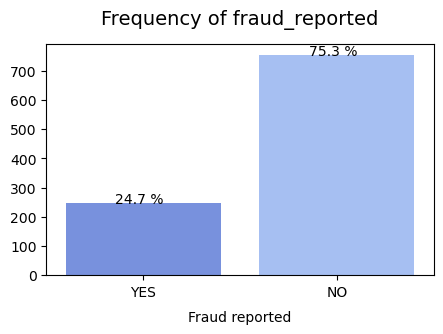

In [50]:
#Univariate Analysis
#Target Feature - Fraud Reported
# Set the custom palette
sns.set_palette('coolwarm')

# Visualize the frequency of fraud_reported
col = 'fraud_reported'
plt.figure(figsize=(5, 3))
ax = sns.countplot(x=col, data=df)
show_percentage(ax, len(df)) 

plt.xlabel('Fraud reported', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.xticks((0, 1), ['YES', 'NO'], size=10)
plt.title(f"Frequency of {col}", size=14, y=1.05);

In [51]:
# Remove and transform the date columns
date_col = ['policy_bind_date', 'incident_date']

for col in date_col:
    categorical_col.remove(col)
    df[col] = pd.to_datetime(df[col])
    print(f"The {col} was transformed as {df[col].dtype}")

The policy_bind_date was transformed as datetime64[ns]
The incident_date was transformed as datetime64[ns]


In [52]:
# List of categorical columns in the dataset
for i,col in enumerate(categorical_col[:-1]):
    print(f"{i+1}. {col}")

1. policy_state
2. policy_csl
3. insured_sex
4. insured_education_level
5. insured_occupation
6. insured_hobbies
7. insured_relationship
8. incident_type
9. collision_type
10. incident_severity
11. authorities_contacted
12. incident_state
13. incident_city
14. property_damage
15. police_report_available
16. auto_make
17. auto_model


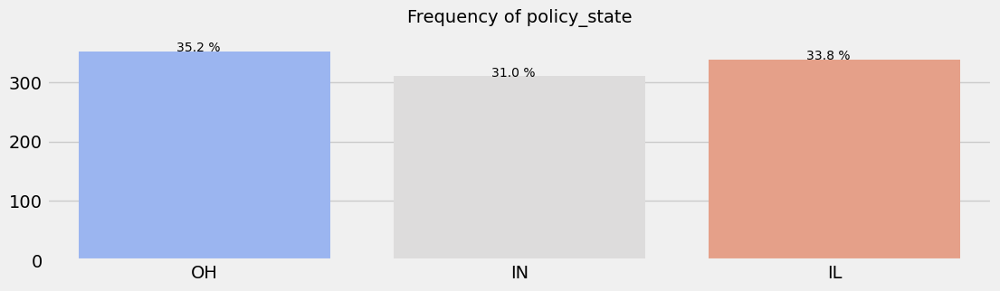

In [61]:
# Visualize the frequency of policy_state
col = 'policy_state'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='coolwarm')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

35.2% of claims correspond to Ohio (OH) policy state, 33.8% to Illinois (IL), and the remaining 31.0% to Indiana (IN).

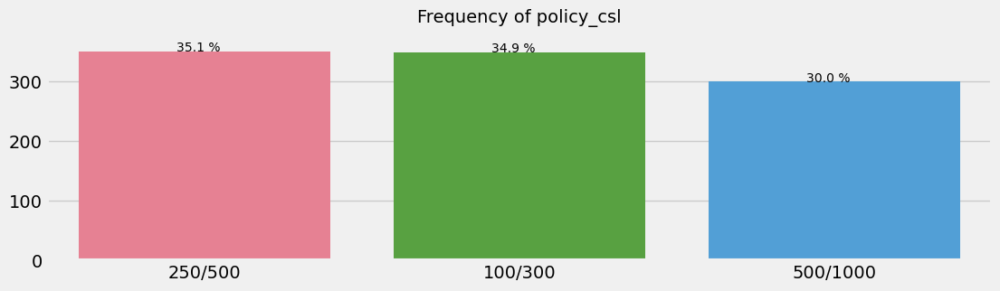

In [62]:
# Visualize the frequency of policy_csl
col = 'policy_csl'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='husl')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

Of the claims, 35.1% are associated with an insurance policy that provides coverage up to 250/500, 34.9% with coverage up to 100/300, and 30.0% with coverage up to 500/1000.

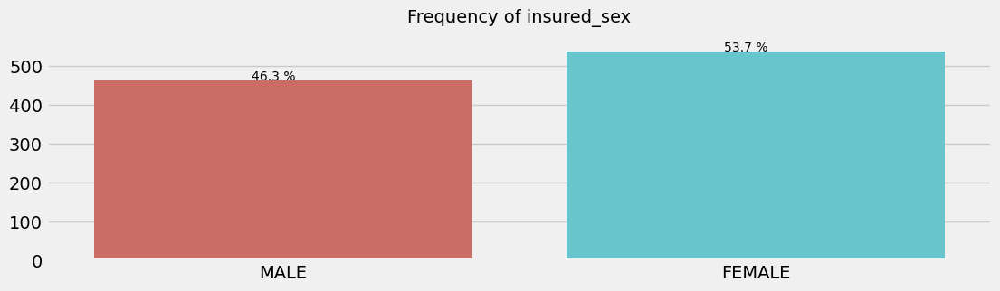

In [64]:
# Visualize the frequency of insured_sex
col = 'insured_sex'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='hls')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

We can observe 53.7% female are insured which is higher when compared to 46.3% of male. 

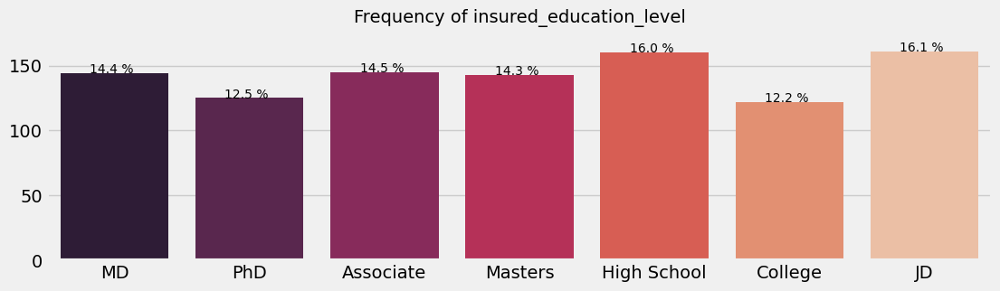

In [65]:
# Visualize the frequency of insured education level
col = 'insured_education_level'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='rocket')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

16.1% of the insured hold a JD degree, 16.0% have completed high school, 14.5% possess an associate degree, 14.4% hold an MD degree, 14.3% have a master's degree, 12.5% have a Ph.D. degree, and 12.2% have a college-level education.

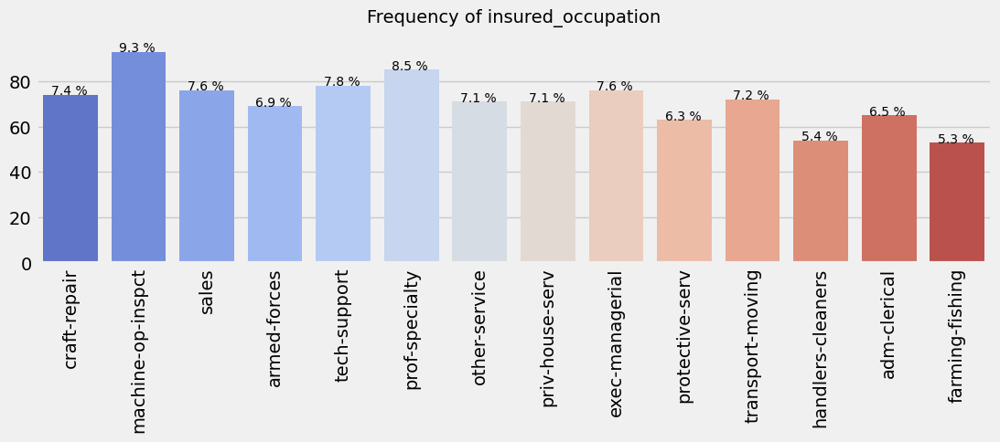

In [68]:
# Visualize the frequency of insured occupation
col = 'insured_occupation'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='coolwarm')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.xticks(rotation=90)
plt.show()

The majority of insured individuals have an occupation in machine-operation and inspection, accounting for 9.3%. This is followed by professional specialties at 8.5%, tech-support at 7.8%, sales and executive-managerial roles at 7.6%, craft-repair at 7.4%, and transport-moving at 7.2%, among others. The least represented occupations are handlers-service at 5.4% and farming-fishing at 5.3%.



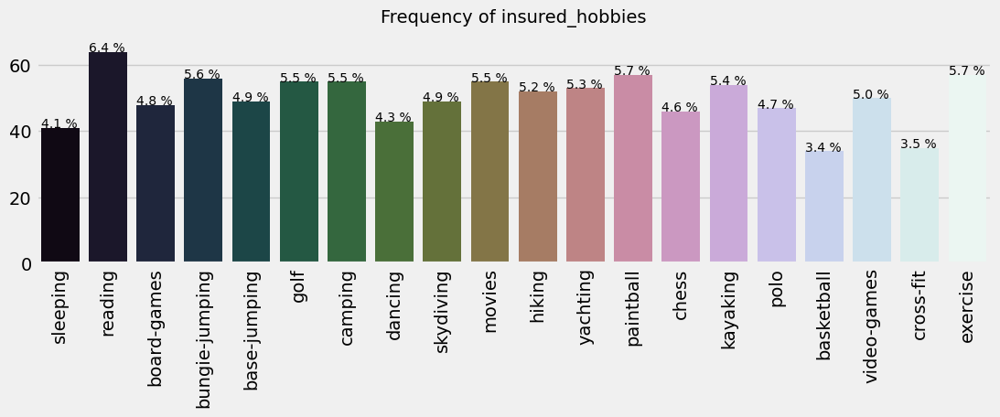

In [69]:
# Visualize the frequency of insured hobbies
col = 'insured_hobbies'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='cubehelix')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.xticks(rotation=90)
plt.show()

We can observe the highest recorded hobby seems to reading with 6.4% with various other types of hobbies. 

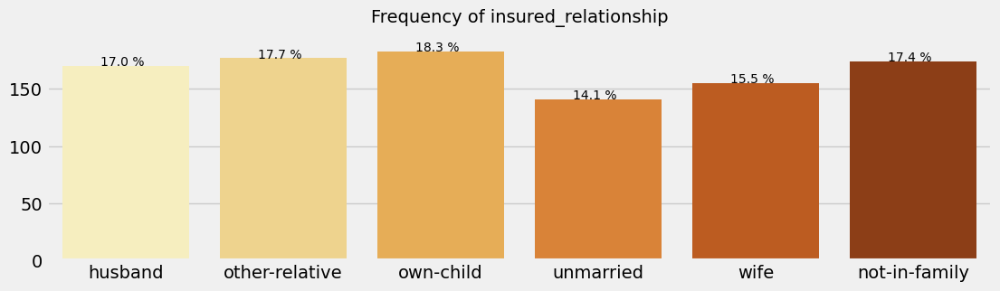

In [71]:
# Visualize the frequency of insured relationship
col = 'insured_relationship'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='YlOrBr')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

We can observe that larger group is own child which is around 18.3% followed by other relative and other relationship follows.

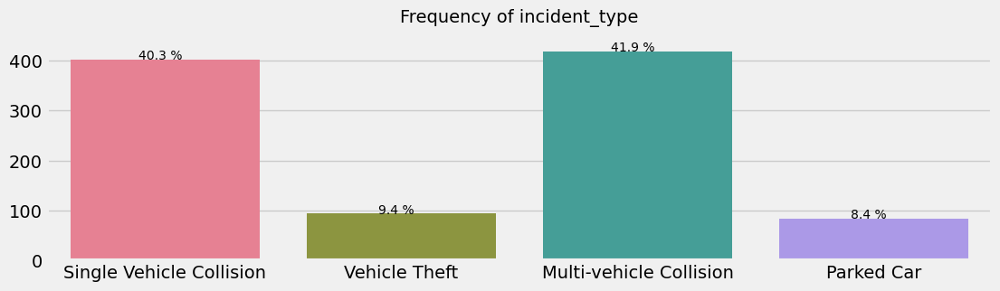

In [72]:
# Visualize the frequency of incident type
col = 'incident_type'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='husl')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

In [73]:
We can observe that most of incident type sums up to mutli vehicle collision which is around 41.9%.

SyntaxError: invalid syntax (1226782996.py, line 1)

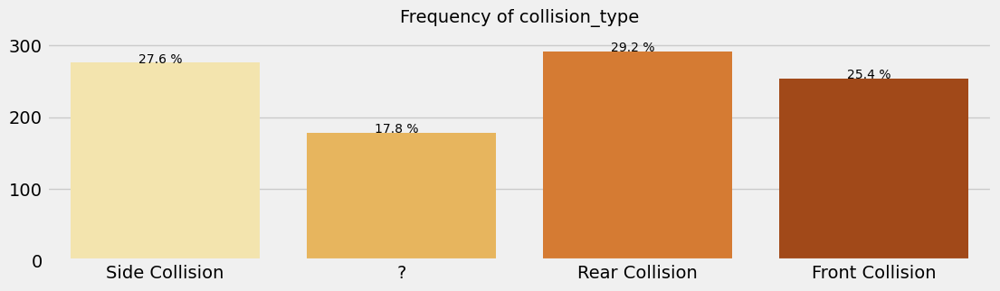

In [74]:
# Visualize the frequency of collision type
col = 'collision_type'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='YlOrBr')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

Most of the collision type seems to be rear collision followed by side collision. 17.8% seems to represent missing values.

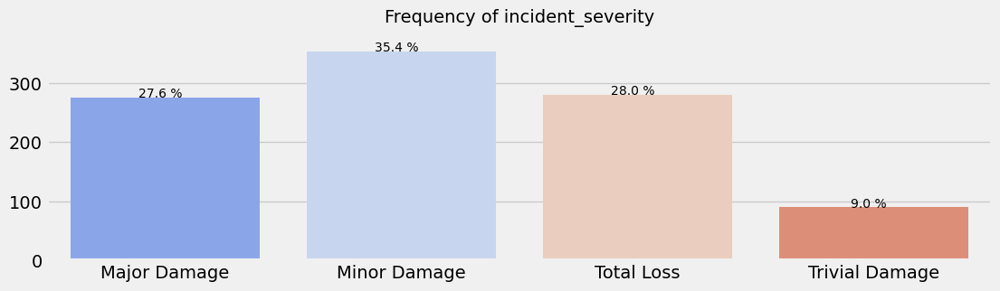

In [75]:
# Visualize the frequency of incident_severity
col = 'incident_severity'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='coolwarm')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

35.4% contributes for minor damage followed by 27.6% consisting of major damage and followed by the total loss and trivial damage.

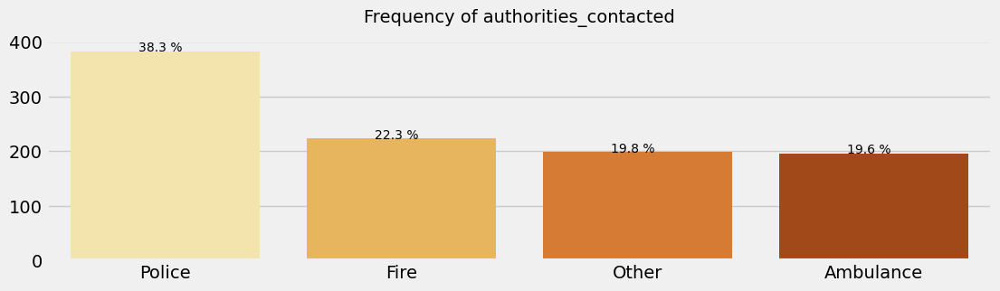

In [76]:
# Visualize the frequency of authorities contacted
col="authorities_contacted"
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='YlOrBr')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

Mostly police are contacted followed by fire .

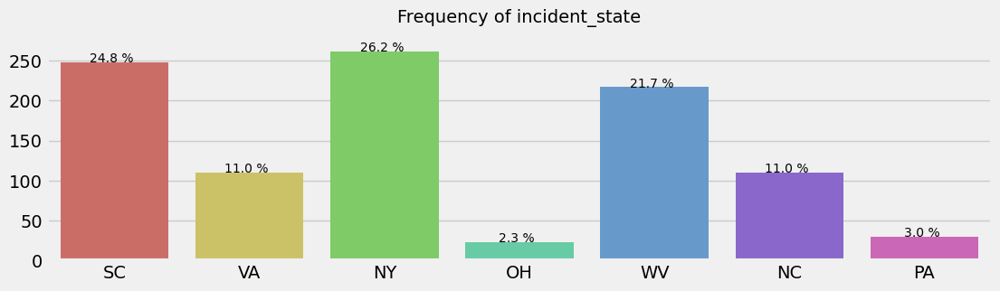

In [77]:
# Visualize the frequency of incident state
col = 'incident_state'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='hls')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

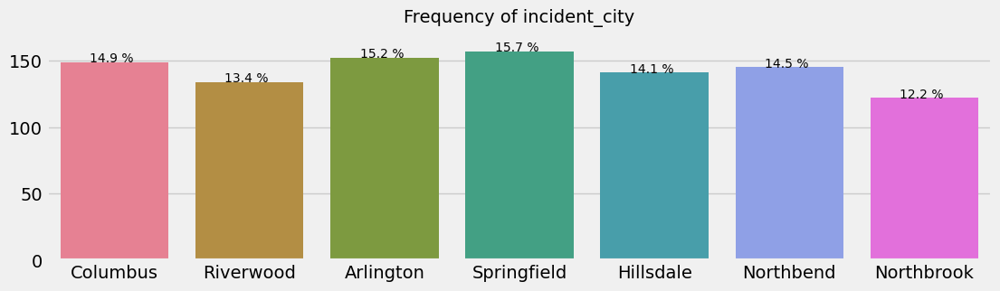

In [78]:
# Visualize the frequency of incident city
col = 'incident_city'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='husl')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

We can observe that Springfield has filed about 15.7% incidents followed by Arlington(15.2%) and columbus(14.9%).

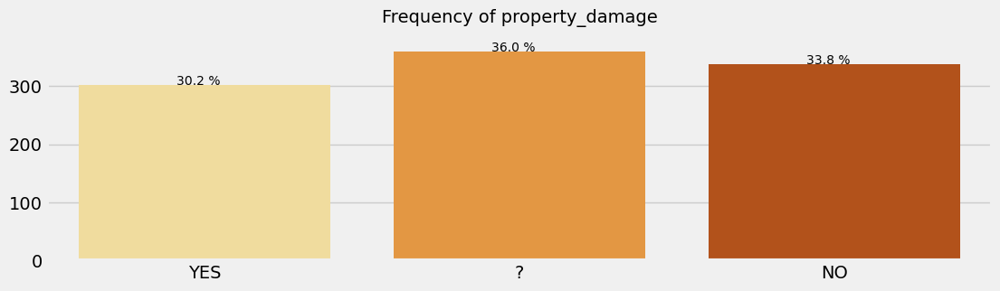

In [79]:
# Visualize the frequency of property damage
col = 'property_damage'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='YlOrBr')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

We can see 33.8% of property not damaged.

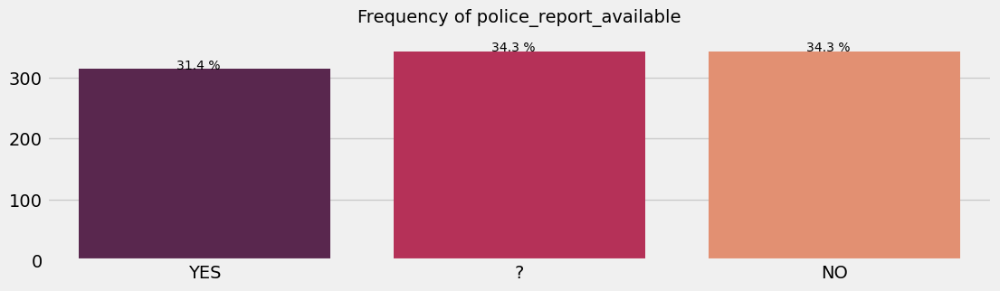

In [80]:
# Visualize the frequency of police report available
col = 'police_report_available'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='rocket')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

We can observe that about 34.3% denotes that no police report is available where we can find equal 34.3% of missing data with 31.4% denoting that police reports are available.

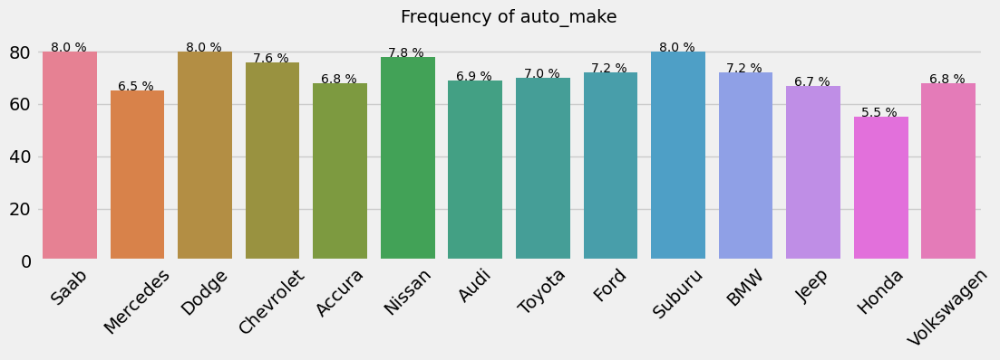

In [82]:
# Visualize the frequency of auto make
col = 'auto_make'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='husl')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.xticks(rotation=45)
plt.show()

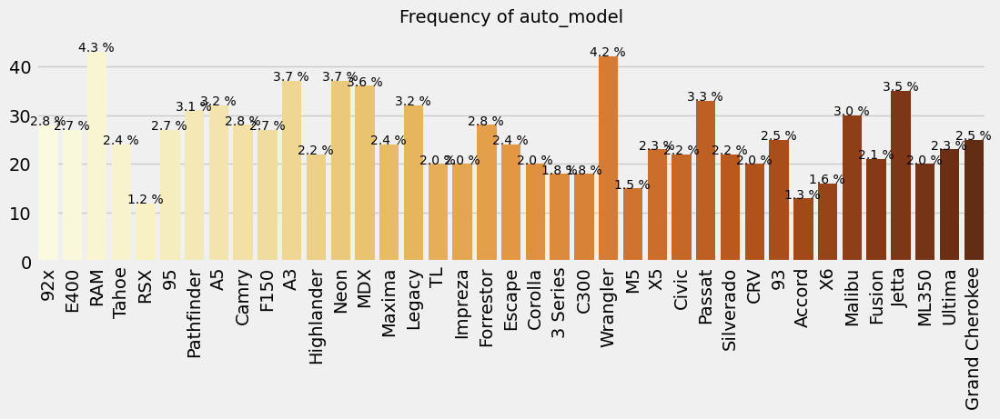

In [86]:
# Visualize the frequency of auto model
col = 'auto_model'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='YlOrBr')
show_percentage(ax, len(df)) 

plt.xlabel('', size=5, labelpad=5)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.xticks(rotation=90)
plt.show()

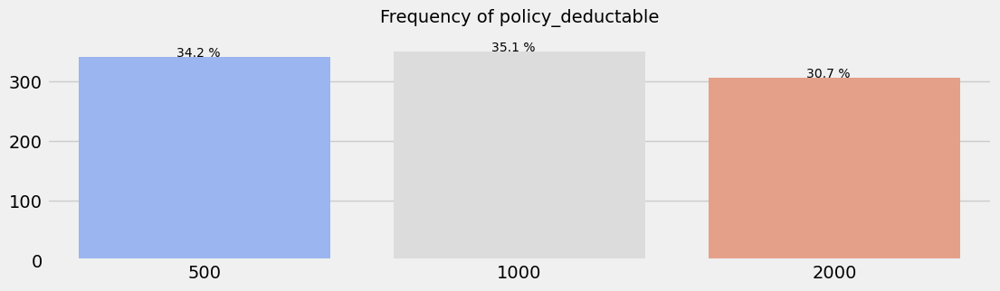

In [87]:
# Visualize the frequency of policy_deductable
col = 'policy_deductable'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='coolwarm')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

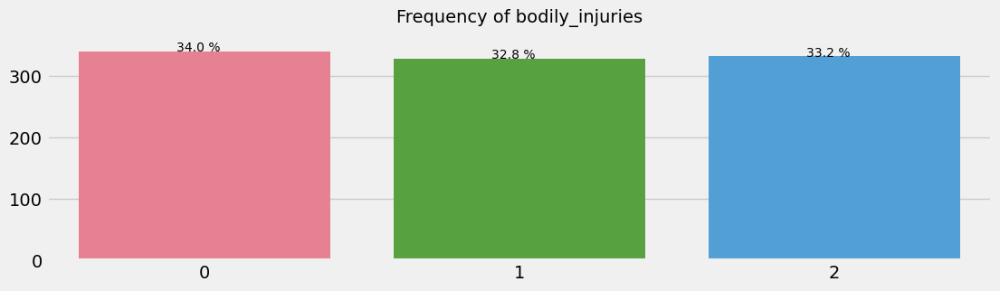

In [88]:
# Visualize the frequency of insured bodily injuries
col = 'bodily_injuries'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='husl')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

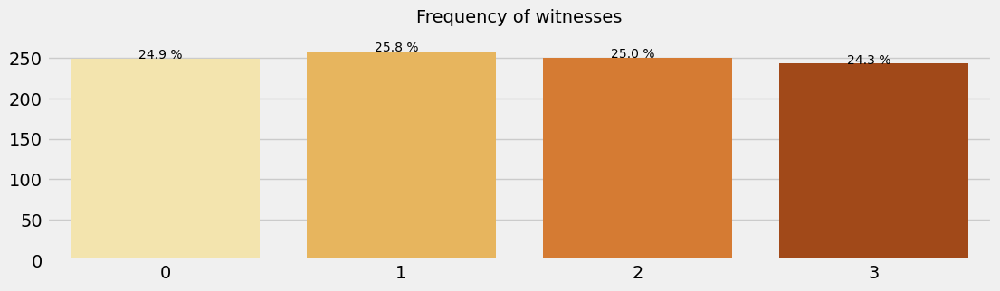

In [89]:
# Visualize the frequency of witnesses
col = 'witnesses'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='YlOrBr')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

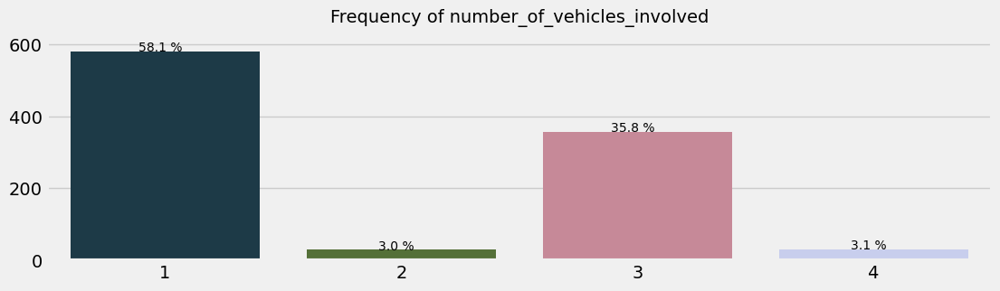

In [92]:
# Visualize the frequency of number of vehicles involved
col = 'number_of_vehicles_involved'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='cubehelix')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

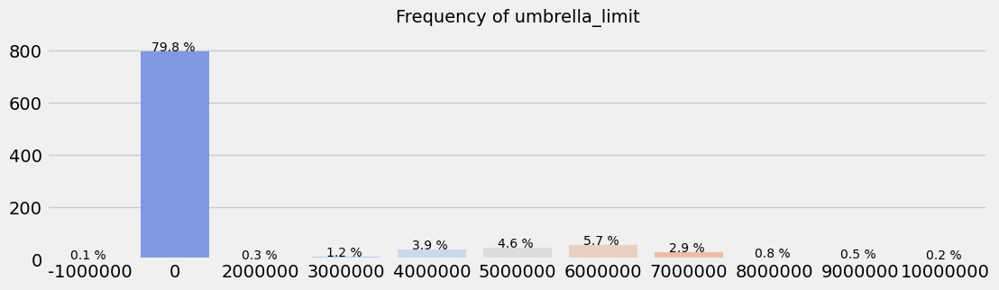

In [93]:
# Visualize the frequency of umbrella limit
col = 'umbrella_limit'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='coolwarm')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

The umbrella_limit comprises extra insurance that provides protection beyond the existing limits and coverages of other policies. 
The behavior of this feature requires observation since 79.8% of the data consists of zero values. The most representative group after the zeros is 6000000, accounting for 5.7%, followed by 5000000 with 4.6%, 4000000 with 3.9%, and 7000000 with 2.9%, among others, which do not exceed 1.2%.

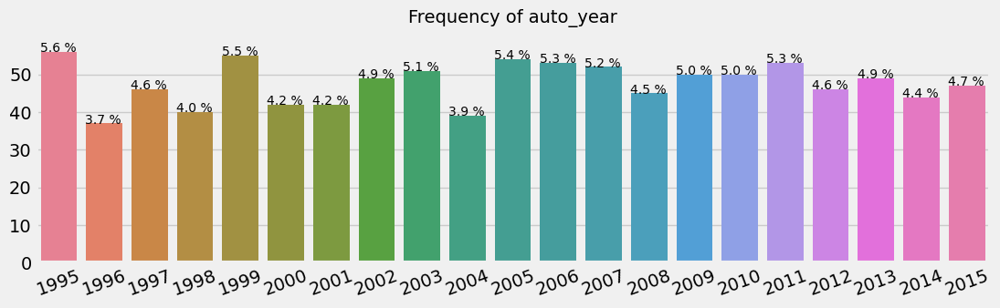

In [97]:
# Visualize the frequency of auto year
col = 'auto_year'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='husl')
show_percentage(ax, len(df)) 

plt.xlabel('', size=5, labelpad=4)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.xticks(rotation=20)
plt.show()

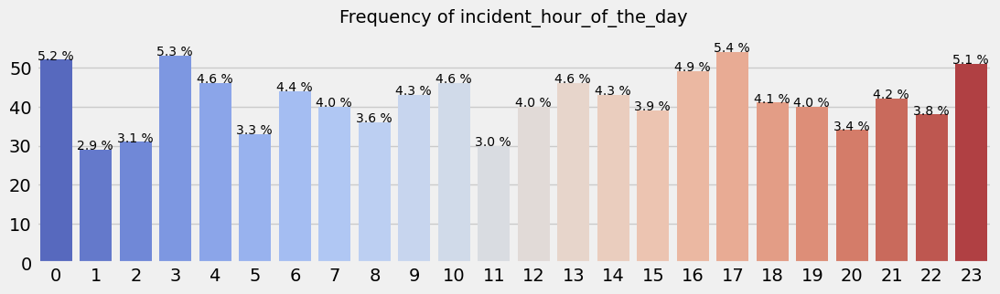

In [99]:
# Visualize the frequency of incident hour of the day
col='incident_hour_of_the_day'
plt.figure(figsize=(12, 3))
ax = sns.countplot(x=col, data=df, palette='coolwarm')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=4)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.show()

Regarding the hour of the day for incidents, the five most representative hours are 17:00, accounting for 5.4%; followed by 03:00 with 5.3%, 00:00 with 5.2%, 23:00 with 5.1%, and 16:00 with 4.9%, among others. The least common hour is 01:00, accounting for 2.9%.



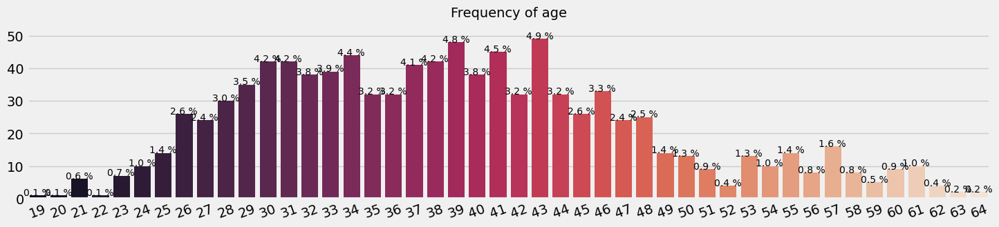

In [102]:
# Visualize the frequency of age
col = 'age'
plt.figure(figsize=(16, 3))
ax = sns.countplot(x=col, data=df, palette='rocket')
show_percentage(ax, len(df)) 

plt.xlabel('', size=10, labelpad=4)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)
plt.xticks(rotation=20)
plt.show()

We can see that the most recorded age is 43 with 4.9%.

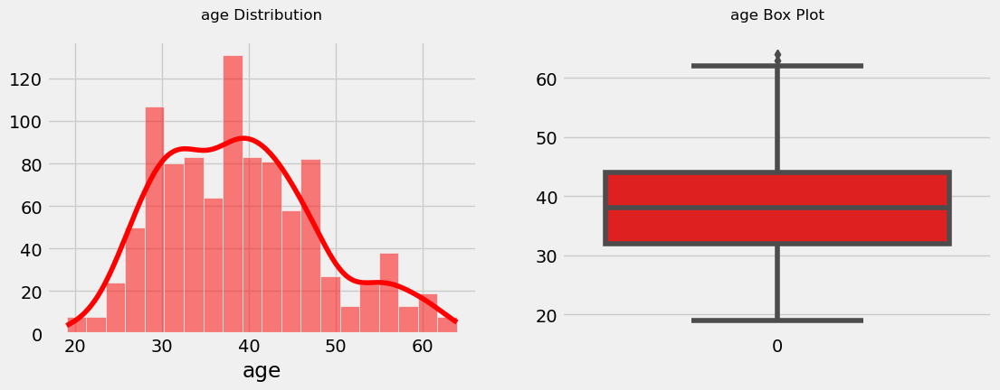

Skewness of age : 0.47898804709224163


In [104]:
col = 'age'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='red')
sns.boxplot(df[col], ax=axes[1], color='red')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)

plt.show()

# Show the skewness of Age
print(f"Skewness of {col} : {df[col].skew()}")


There seems to be slight right side skewness and outliers are present in the presentation.

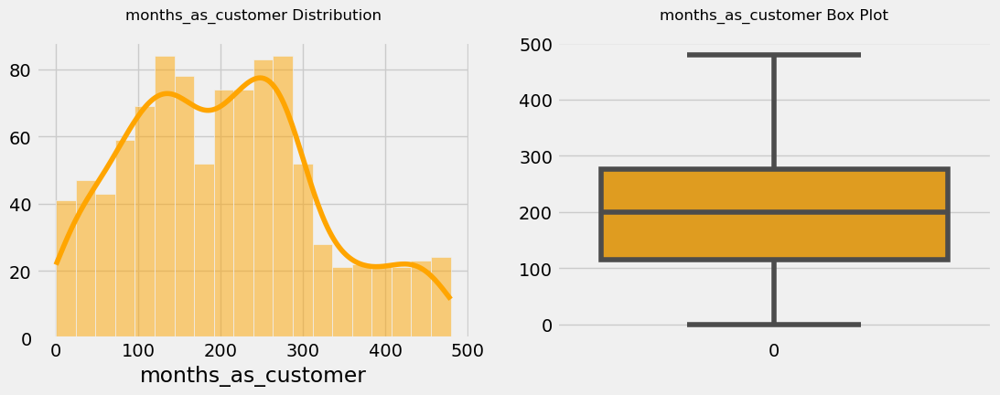

Skewness of months_as_customer : 0.3621768477780205


In [105]:
#Visualize (1) months_as_customer distribution
col = 'months_as_customer'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='orange')
sns.boxplot(df[col], ax=axes[1], color='orange')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)

plt.show()

# Show the skewness of months_as_customer
print(f"Skewness of {col} : {df[col].skew()}")

There is slight skewness to the right and there are no outliers present in the box plot.

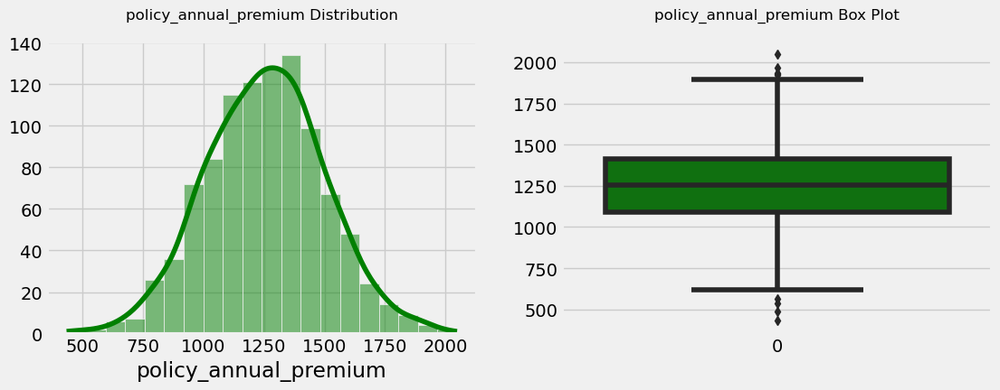

Skewness of policy_annual_premium : 0.004401994526610823


In [106]:
#Visualize (2) policy_annual_premium distribution
col = 'policy_annual_premium'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='green')
sns.boxplot(df[col], ax=axes[1], color='green')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)

plt.show()

# Show the skewness of policy_annual_premium
print(f"Skewness of {col} : {df[col].skew()}")

The distribution seems to be almost normal and there are outliers present in the box plot.

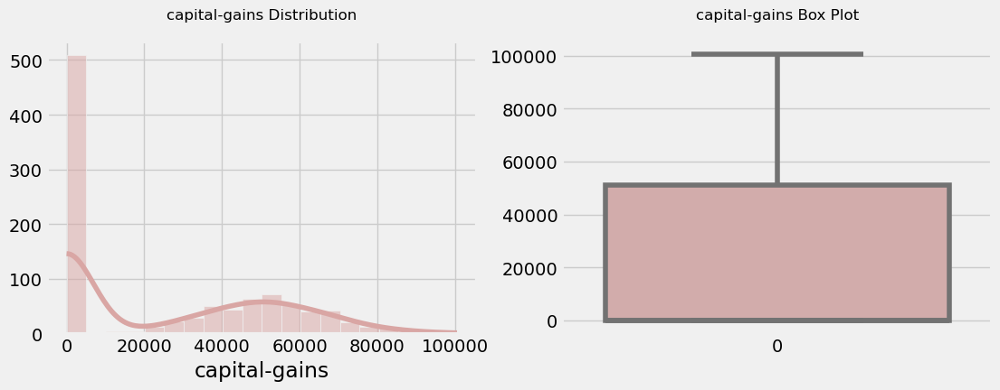

Skewness of capital-gains : 0.4788502295807907


In [107]:
#Visualize (3) capital-gains distribution
col = 'capital-gains'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='#d9a6a4')
sns.boxplot(df[col], ax=axes[1], color='#d9a6a4')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)

plt.show()

# Show the skewness of capital-gains
print(f"Skewness of {col} : {df[col].skew()}")

The distribution of capital-gains is skewed to the right due the large number of zeros in the data. There are NO outliers present in the Box plot.

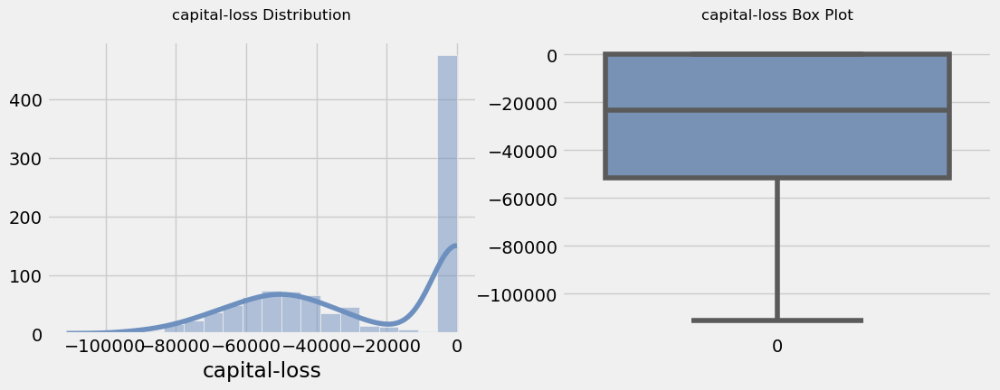

Skewness of capital-loss : -0.39147194299389343


In [108]:
#Visualize (4) capital-loss distribution
col = 'capital-loss'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='#6e90bf')
sns.boxplot(df[col], ax=axes[1], color='#6e90bf')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)

plt.show()

# Show the skewness of capital-loss
print(f"Skewness of {col} : {df[col].skew()}")

The distribution of capital-loss is left-skewed, primarily due to a significant number of zeros and negative values in the data. No outliers are present in the box plot.

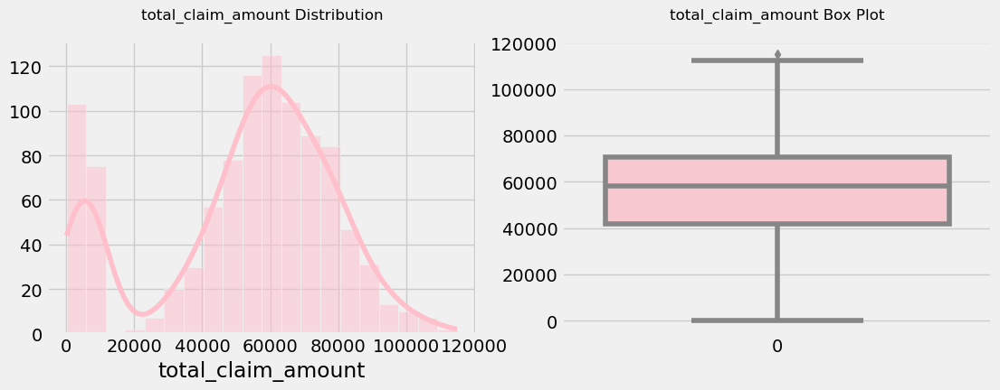

Skewness of total_claim_amount : -0.594581988510234


In [109]:
#Visualize (5) total_claim_amount distribution
col = 'total_claim_amount'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='pink')
sns.boxplot(df[col], ax=axes[1], color='pink')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)

plt.show()

# Show the skewness of total_claim_amount
print(f"Skewness of {col} : {df[col].skew()}")

The distribution seems to be skewed to the left due to zeros in the data and there are no outliers present.

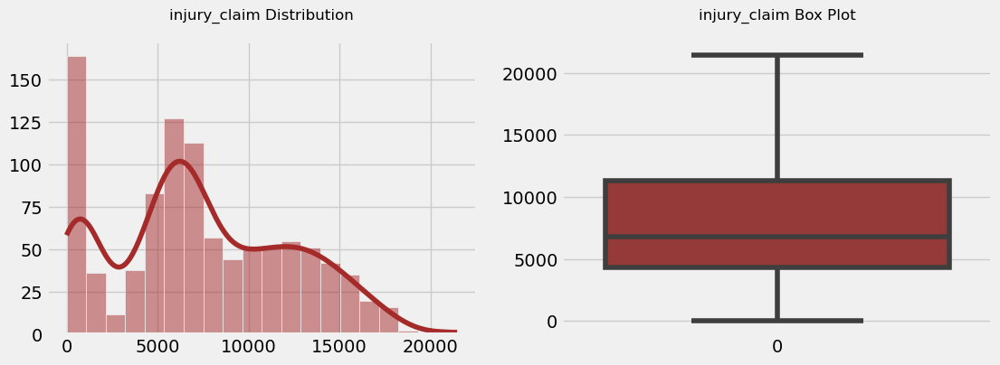

Skewness of injury_claim : 0.26481087847181833


In [110]:
#Visualize (6) injury_claim distribution
col = 'injury_claim'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='brown')
sns.boxplot(df[col], ax=axes[1], color='brown')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)
axes[0].set_xlabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)
axes[1].set_xlabel('', size=10, labelpad=8)

plt.show()

# Show the skewness of injury_claim
print(f"Skewness of {col} : {df[col].skew()}")

The distribution seems to be skewed to the right and no outliers present.

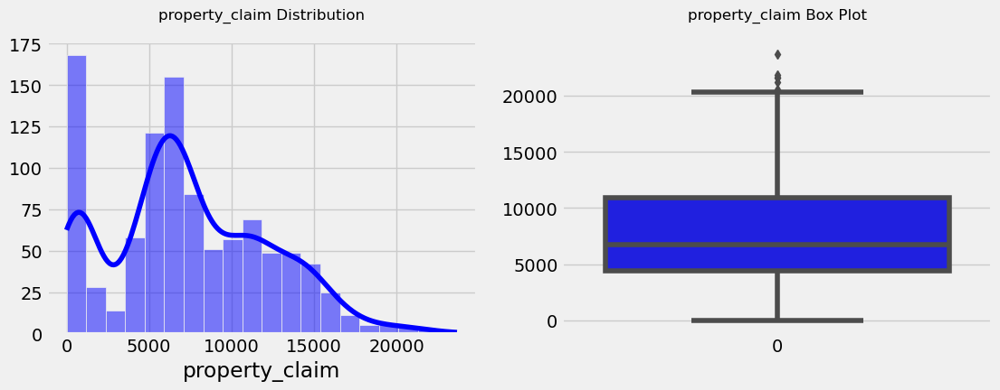

Skewness of property_claim : 0.3781687764308289


In [113]:
#Visualize (7) property_claim distribution
col = 'property_claim'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='Blue')
sns.boxplot(df[col], ax=axes[1], color='Blue')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)

plt.show()

# Show the skewness of property_claim
print(f"Skewness of {col} : {df[col].skew()}")


The distribution is skewed to the right and there are outliers present.

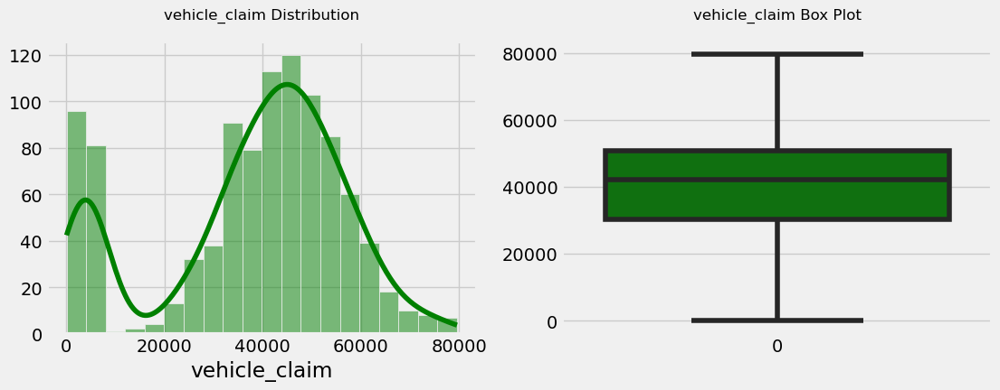

Skewness of vehicle_claim : -0.6210979312228687


In [114]:
#Visualize (8) vehicle_claim distribution
col = 'vehicle_claim'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='Green')
sns.boxplot(df[col], ax=axes[1], color='Green')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)

plt.show()

# Show the skewness of vehicle_claim
print(f"Skewness of {col} : {df[col].skew()}")

The distribution is skewed to the left and there are no outliers present.

In [115]:
numerical_col

['months_as_customer',
 'policy_annual_premium',
 'capital-gains',
 'capital-loss',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim']

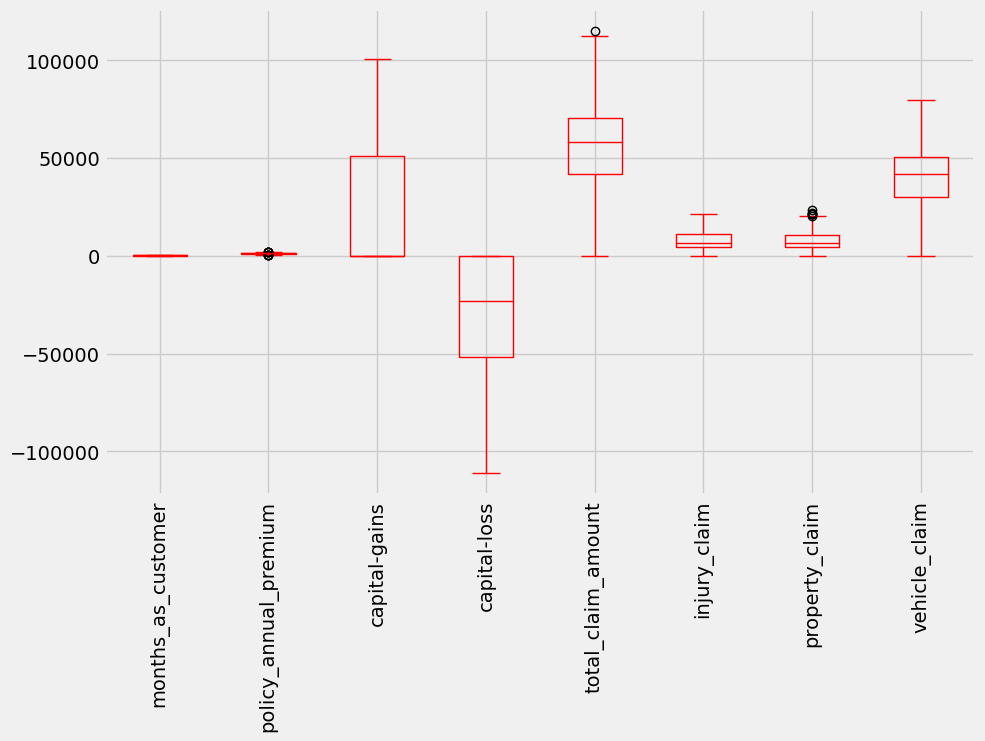

In [116]:
#Univariate Box Plot
plt.figure(figsize=(10, 6))
df.boxplot(column=numerical_col, figsize=(10,10), color='red')
plt.xticks(rotation=90);

In [117]:
def boxplot_by_fraud_reported(col, xlabel, figsize, palette):
    plt.figure(figsize=figsize)
    sns.set_palette(palette)
    sns.boxplot(data=df[[col,'fraud_reported']], x=col, y='fraud_reported')
    plt.ylabel('Fraud Reported')
    plt.xlabel(xlabel)
    plt.title(f"BoxPlot of {col} vs. Fraud reported")
    plt.show()

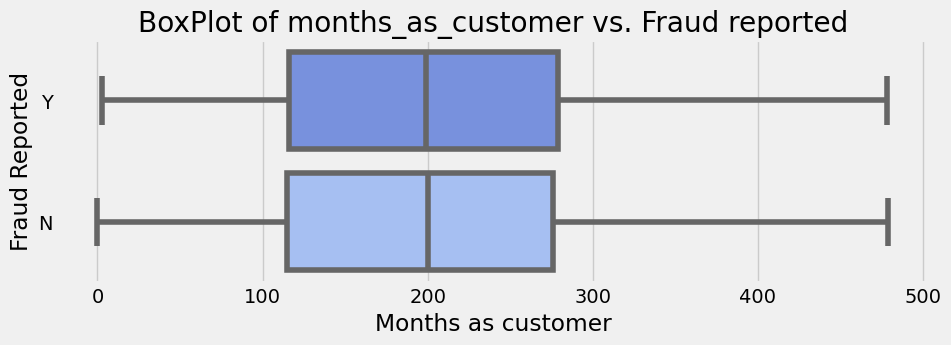

In [119]:
# Visualizing and comparing each independent variable with target
# Columns 1. months_as_customer 
col = 'months_as_customer'
boxplot_by_fraud_reported(col, 'Months as customer', figsize=(10,3), palette='coolwarm')


It appears that the number of months of patronage (months_as_customer) has no impact on whether the claim is reported as fraud or not.

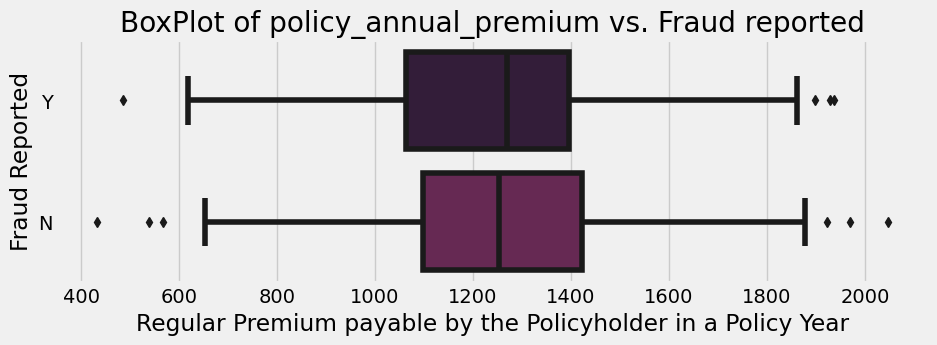

In [120]:
# Visualizing and comparing each independent variable with target
# Columns 2. policy_annual_premium 
col = 'policy_annual_premium'
boxplot_by_fraud_reported(col, 
                          'Regular Premium payable by the Policyholder in a Policy Year', 
                          figsize=(10, 3), palette='rocket')

It appears that the Regular Premium payable by the policyholder in a policy year (policy_annual_premium) has a slightly impact on whether the claim is reported as fraud or not.

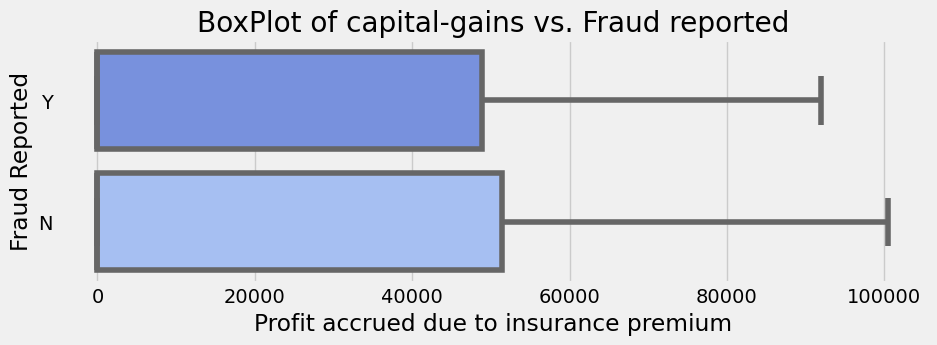

In [121]:
# Visualizing and comparing each independent variable with target
# Columns 3. capital-gains 
col = 'capital-gains'
boxplot_by_fraud_reported(col, 
                          'Profit accrued due to insurance premium', 
                          figsize=(10, 3), palette='coolwarm')

It appears that profit accrued from insurance premiums (capital-gains) has a similar impact on whether the claim is reported as fraud or not.



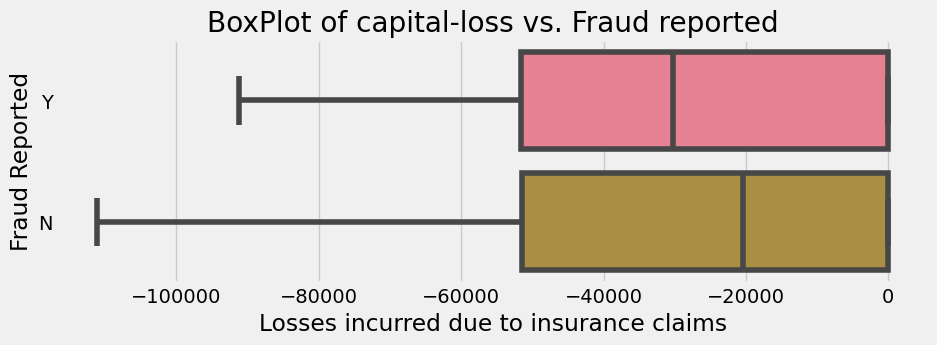

In [124]:
# Visualizing and comparing each independent variable with target
# Columns 4. capital-loss 
col = 'capital-loss'
boxplot_by_fraud_reported(col, 
                          'Losses incurred due to insurance claims', 
                          figsize=(10, 3), palette='husl')

It seems that, on average, losses incurred due to insurance claims (capital-loss) are lower for non-fraudulent claims compared to claims reported as fraud.

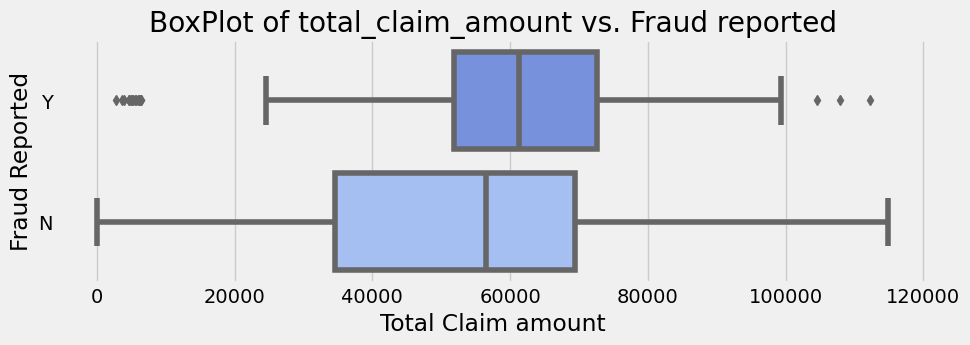

In [125]:
# Visualizing and comparing each independent variable with target
# Columns 5. total_claim_amount 
col = 'total_claim_amount'
boxplot_by_fraud_reported(col, 
                          'Total Claim amount', 
                          figsize=(10, 3), palette='coolwarm')


The financial implications of claims (total_claim_amount) reported as fraud tend to fall within the range of 
to just under $ 50000 to $ 70000 with an average exceeding $ 60000. 
On the other hand,non-fraudulent claims typically have an average total_claim_amount of less than $ 60000.




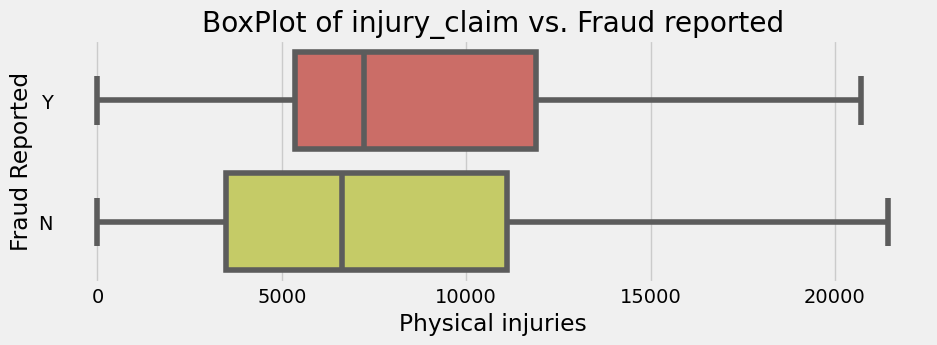

In [127]:
# Visualizing and comparing each independent variable with target
# Columns 6. injury_claim 
col = 'injury_claim'
boxplot_by_fraud_reported(col, 
                          'Physical injuries', 
                          figsize=(10, 3), palette='hls')

The claims reported as fraud tend to have higher values for physical injuries sustained compared to non-fraudulent claims. As seen in the plot above, the majority of fraudulent claims report physical injuries ranging from over 5000 to almost 12000. In contrast, non-fraudulent claims typically fall within a slightly lower range of 3000 to 11000.

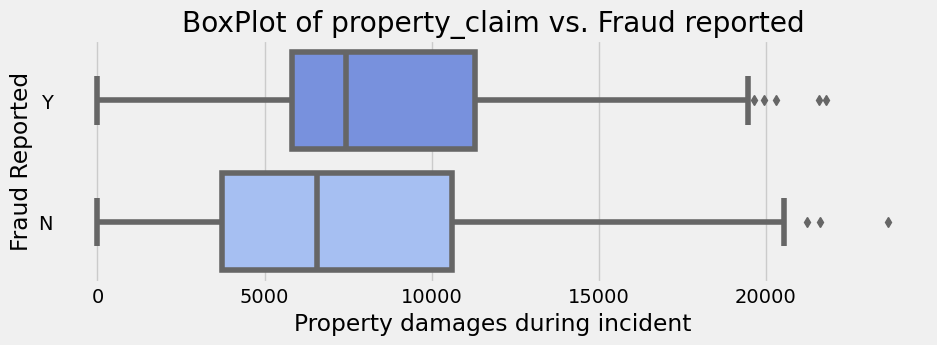

In [128]:
# Visualizing and comparing each independent variable with target
# Columns 7. property_claim
col = 'property_claim'
boxplot_by_fraud_reported(col, 
                          'Property damages during incident', 
                          figsize=(10, 3), palette='coolwarm')

The claims reported as fraud tend to have higher values for property damages compared to non-fraudulent claims. As seen in the plot above, the majority of fraudulent claims report physical injuries ranging from over 6000 to almost 12000. In contrast, non-fraudulent claims typically fall within a slightly lower range of 3000 to 11000, with some exceptions.

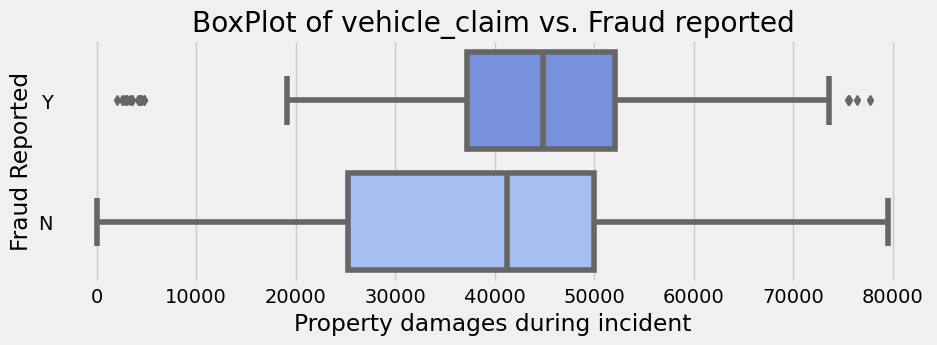

In [136]:
# Visualizing and comparing each independent variable with target
# Columns 8. vehicle_claim
col = 'vehicle_claim'
boxplot_by_fraud_reported(col, 
                          'Property damages during incident', 
                          figsize=(10, 3), palette='coolwarm')

The claims reported as fraud tend to have higher values for property damages (vehicles) compared to non-fraudulent claims.

In [132]:
#Relation between Target and categorical columns.
# List of categorical columns in the dataset
for i,col in enumerate(categorical_col[:-1] + num_cat_col):
    print(f"{i+1}. {col}")

1. policy_state
2. policy_csl
3. insured_sex
4. insured_education_level
5. insured_occupation
6. insured_hobbies
7. insured_relationship
8. incident_type
9. collision_type
10. incident_severity
11. authorities_contacted
12. incident_state
13. incident_city
14. property_damage
15. police_report_available
16. auto_make
17. auto_model
18. policy_deductable
19. bodily_injuries
20. witnesses
21. number_of_vehicles_involved
22. umbrella_limit
23. auto_year
24. incident_hour_of_the_day
25. age


In [133]:
def plot_counts_by_fraud_reported(col, xlabel, figsize, show_perc, rot=0):
    plt.figure(figsize=figsize)
    ax = sns.countplot(hue='fraud_reported', x=col, data=df)
    if (show_perc==True):
        show_percentage(ax, len(df)) 

    if xlabel != '':
        title = xlabel
    else:
        title = col
    
    plt.xlabel(xlabel, size=10, labelpad=8)
    plt.ylabel('', size=10, labelpad=8)
    plt.xticks(rotation=rot)
    plt.legend(prop={'size':8}, loc='upper right', bbox_to_anchor=(1.20, 1)).set_title("Fraud Reported")
    plt.title(f"Fraud Reported according to {title}", size=14, y=1.05)
    plt.show()

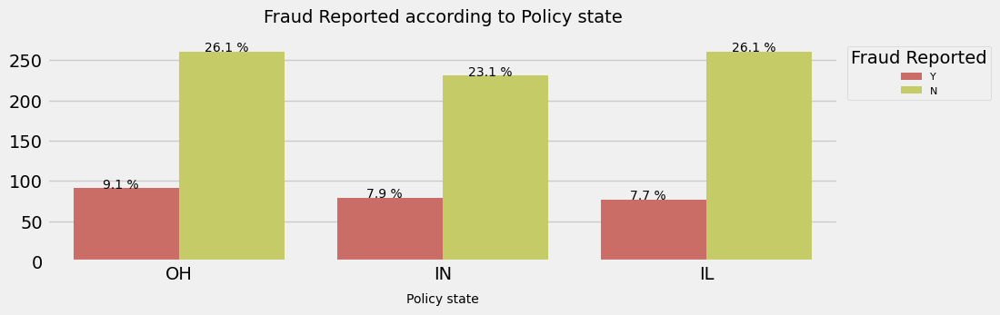

In [134]:
# Compare (1) <policy_state> vs Fraud Reported
col = 'policy_state'
plot_counts_by_fraud_reported(col, xlabel='Policy state', figsize=(10,3), show_perc=True )


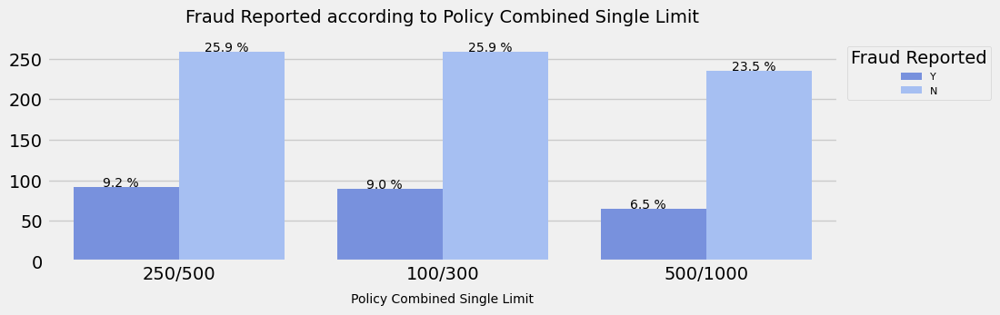

In [137]:
# Compare (2) <policy_csl> vs Fraud Reported
col = 'policy_csl'
plot_counts_by_fraud_reported(col, xlabel='Policy Combined Single Limit', figsize=(10,3), show_perc=True )


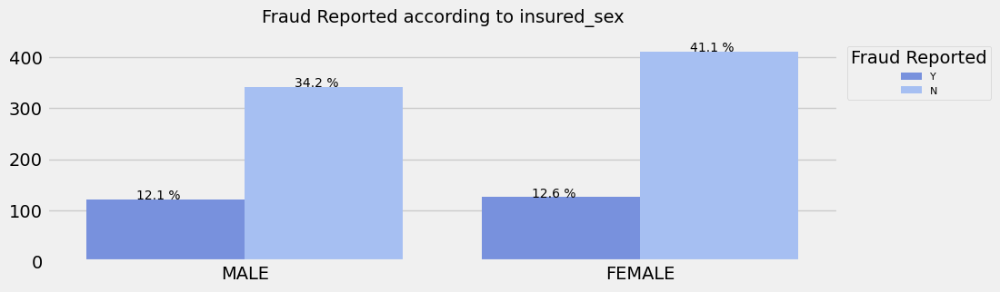

In [138]:
# Compare (3) <insured_sex> vs Fraud Reported
col = 'insured_sex'
plot_counts_by_fraud_reported(col, xlabel='', figsize=(10,3), show_perc=True )

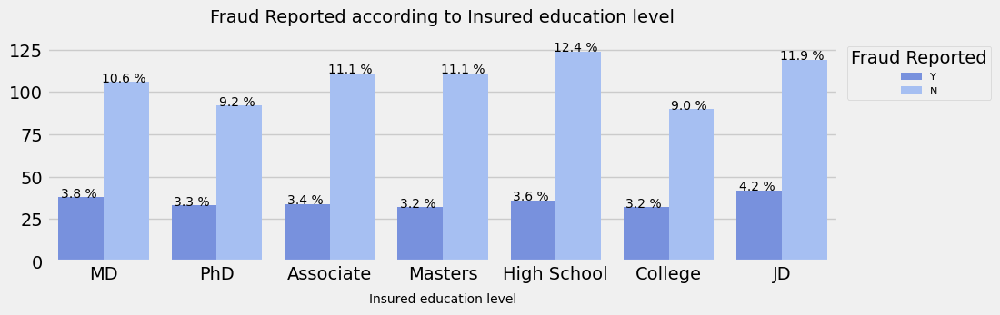

In [139]:
# Compare (4) <insured_education_level> vs Fraud Reported
col = 'insured_education_level'
plot_counts_by_fraud_reported(col, xlabel='Insured education level', figsize=(10,3), show_perc=True )

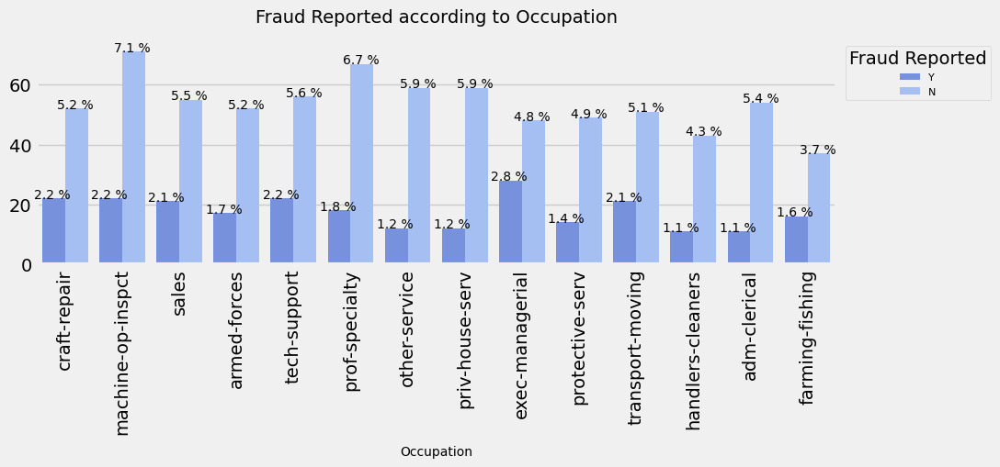

In [140]:
# Compare (5) <insured_occupation> vs Fraud Reported
col = 'insured_occupation'
plot_counts_by_fraud_reported(col, xlabel='Occupation', figsize=(10,3), show_perc=True, rot=90 )

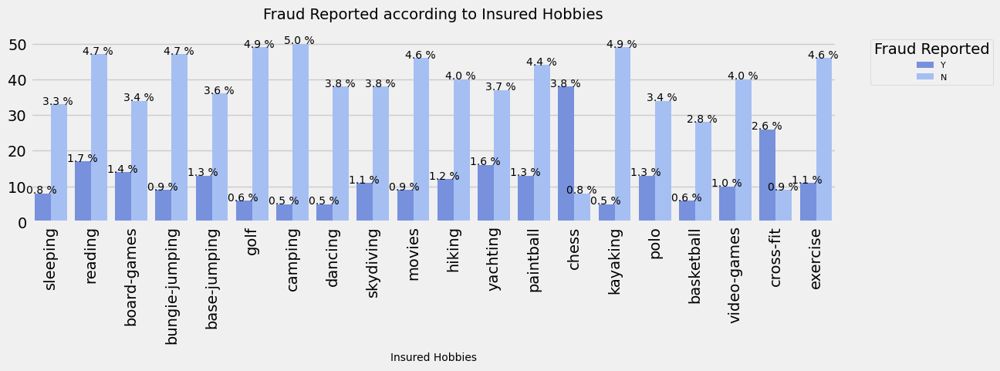

In [141]:
# Compare (6) <insured_hobbies> vs Fraud Reported
col = 'insured_hobbies'
plot_counts_by_fraud_reported(col, xlabel='Insured Hobbies', figsize=(12,3), show_perc=True, rot=90 )

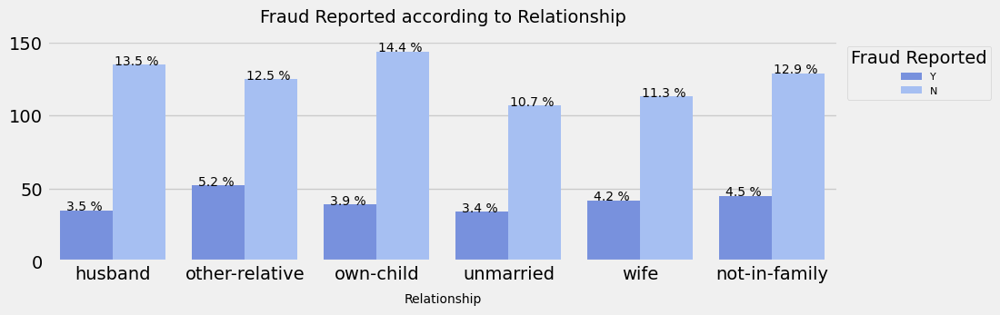

In [142]:
# Compare (7) <insured_relationship> vs Fraud Reported
col = 'insured_relationship'
plot_counts_by_fraud_reported(col, xlabel='Relationship', figsize=(10,3), show_perc=True )


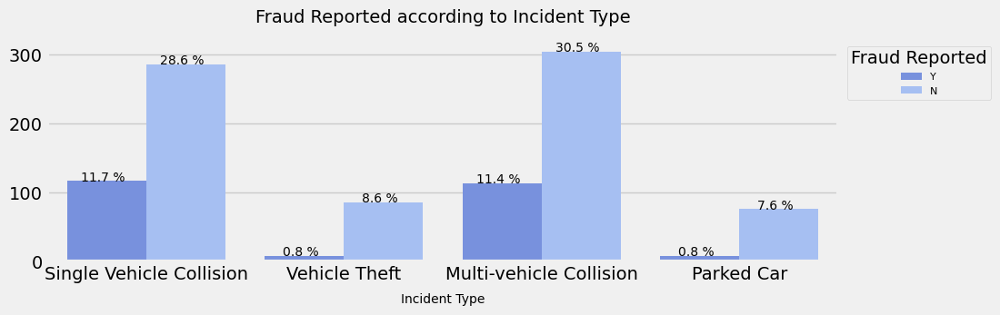

In [143]:
# Compare (8) <incident_type> vs Fraud Reported
col = 'incident_type'
plot_counts_by_fraud_reported(col,xlabel='Incident Type',figsize=(10,3),show_perc=True)

The highest percentage of reported fraudulent claims corresponds to single-vehicle collisions, accounting for 11.7%.

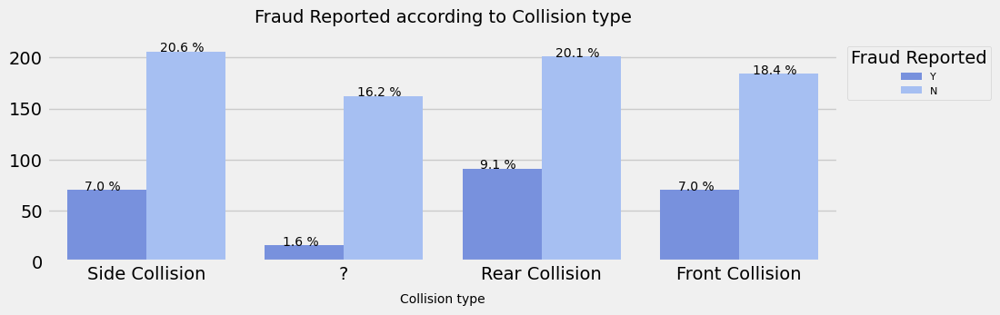

In [144]:
# Compare (9) <collision_type> vs Fraud Reported
col = 'collision_type'
plot_counts_by_fraud_reported(col, xlabel='Collision type', figsize=(10,3), show_perc=True )


The highest percentage of reported fraudulent claims corresponds to rear collisions, accounting for 9.1%, followed by front and side collisions at 7.0%.

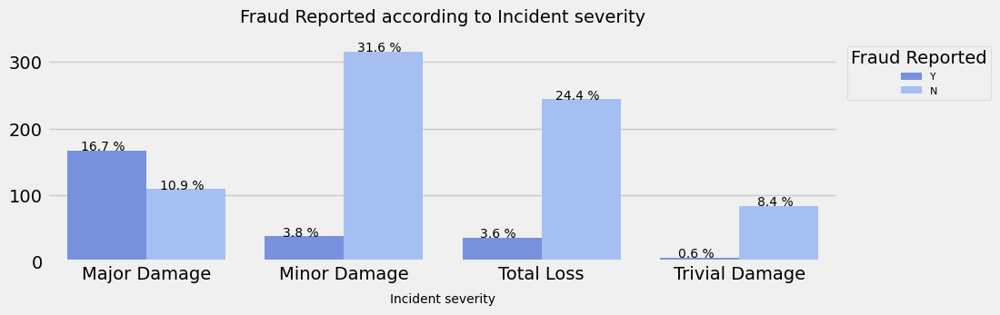

In [145]:
# Compare (10) <incident_severity> vs Fraud Reported
col = 'incident_severity'
plot_counts_by_fraud_reported(col, xlabel='Incident severity', figsize=(10,3), show_perc=True )

The highest percentage of reported fraudulent claims corresponds to Major Damage about 16.7%.

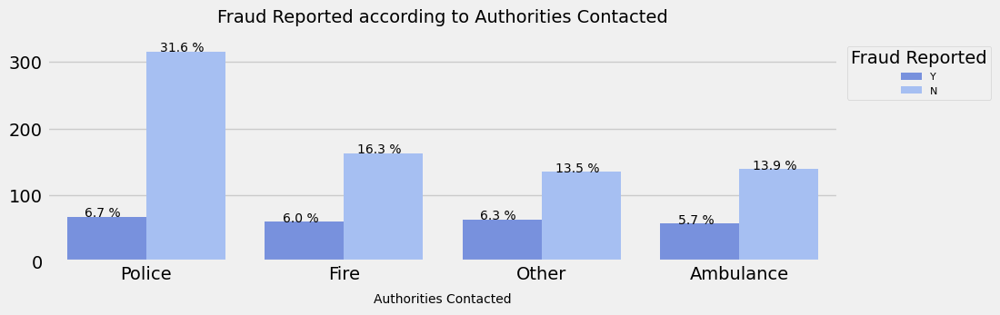

In [146]:
# Compare (11) <authorities_contacted> vs Fraud Reported
col = 'authorities_contacted'
plot_counts_by_fraud_reported(col, xlabel='Authorities Contacted', figsize=(10,3), show_perc=True )

The highest percentage of reported fraudulent claims corresponds to Police (6.7%).

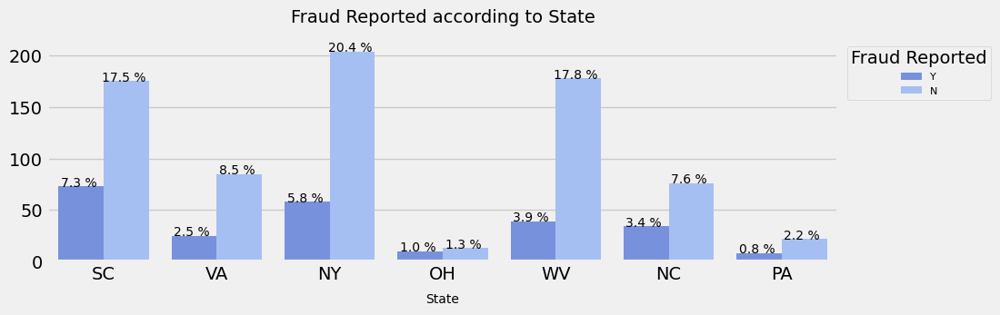

In [148]:
# Compare (12) <incident_state> vs Fraud Reported
col = 'incident_state'
plot_counts_by_fraud_reported(col, xlabel='State', figsize=(10,3), show_perc=True )

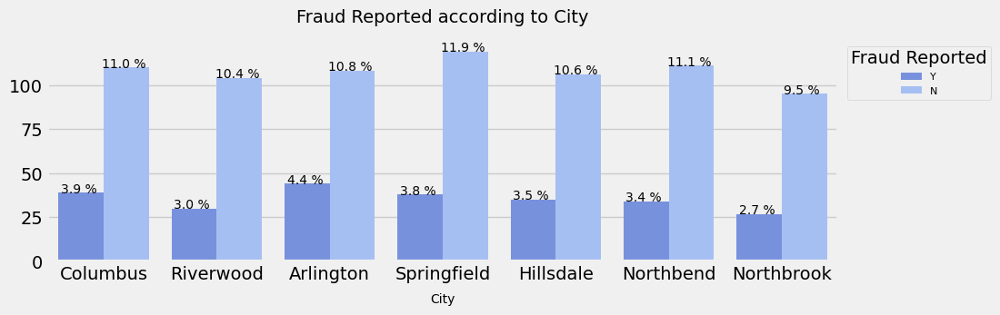

In [149]:
# Compare (13) <incident_city> vs Fraud Reported
col = 'incident_city'
plot_counts_by_fraud_reported(col, xlabel='City', figsize=(10,3), show_perc=True )

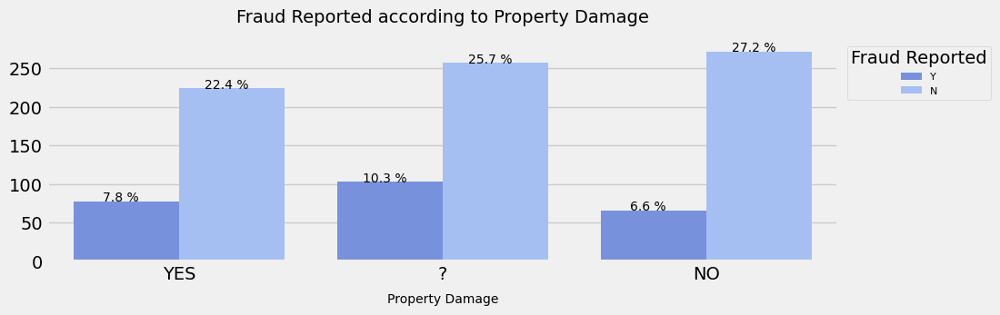

In [150]:
# Compare (14) <property_damage> vs Fraud Reported
col = 'property_damage'
plot_counts_by_fraud_reported(col, xlabel='Property Damage', figsize=(10,3), show_perc=True )


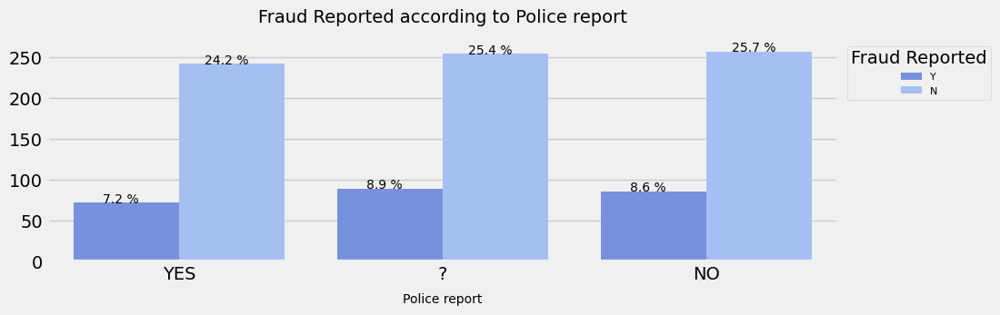

In [151]:
# Compare (15) <police_report_available> vs Fraud Reported
col = 'police_report_available'
plot_counts_by_fraud_reported(col, xlabel='Police report', figsize=(10,3), show_perc=True )

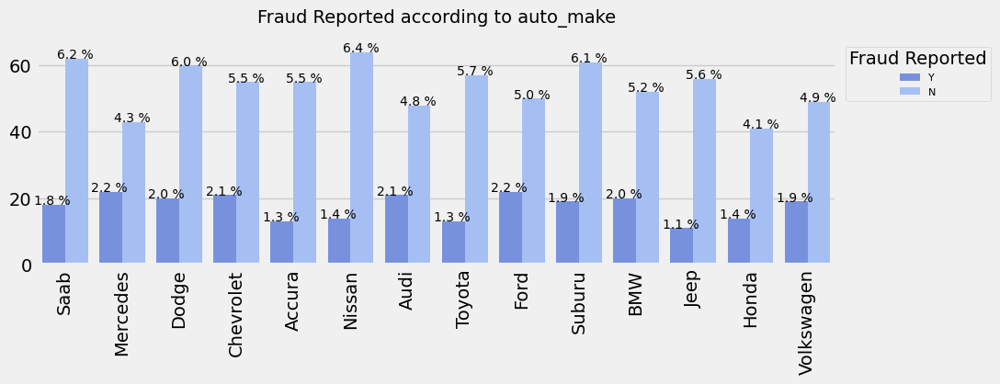

In [152]:
# Compare (16) <auto_make> vs Fraud Reported
col = 'auto_make'
plot_counts_by_fraud_reported(col, xlabel='', figsize=(10,3), show_perc=True, rot=90 )

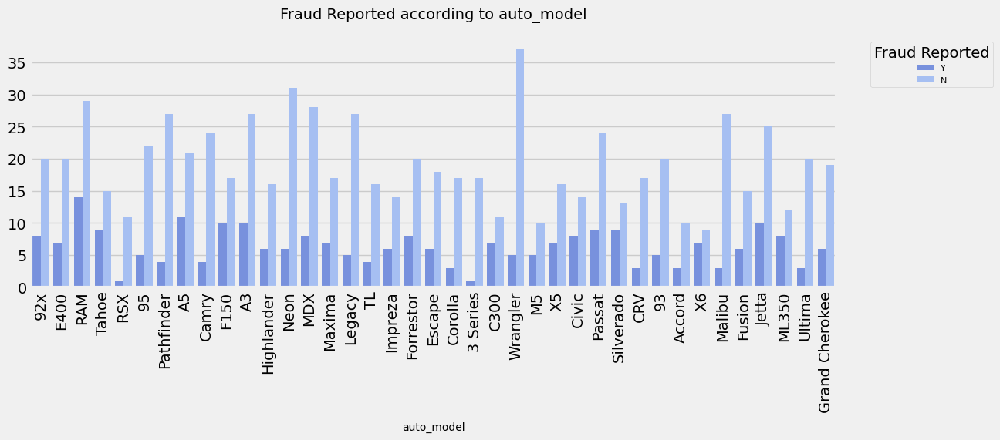

In [153]:
# Compare (17) <auto_model> vs Fraud Reported
col = 'auto_model'
plot_counts_by_fraud_reported(col, xlabel='auto_model', figsize=(12,4), show_perc=False, rot=90 )


The car models most commonly reported in fraudulent claims are RAM, A5, Jetta, A3, and F150. On the other hand, the car models with the fewest fraudulent claims are RSX and 3 Series.

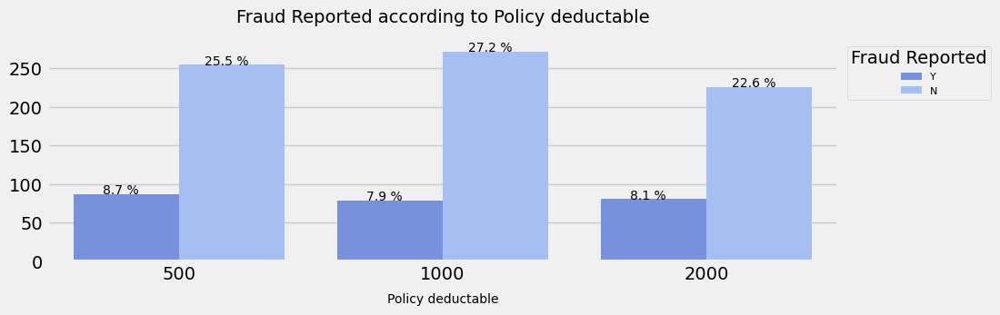

In [154]:
# Compare (18) <policy_deductable> vs Fraud Reported
col = 'policy_deductable'
plot_counts_by_fraud_reported(col, xlabel='Policy deductable', figsize=(10,3), show_perc=True )

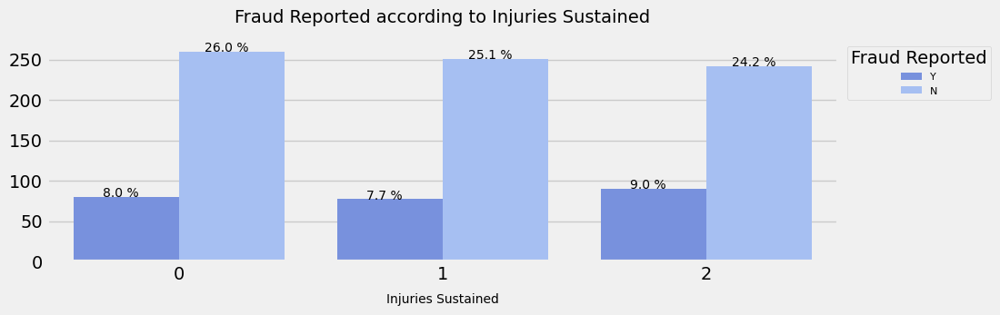

In [155]:
# Compare (19) <bodily_injuries> vs Fraud Reported
col = 'bodily_injuries'
plot_counts_by_fraud_reported(col, xlabel='Injuries Sustained', figsize=(10,3), show_perc=True )

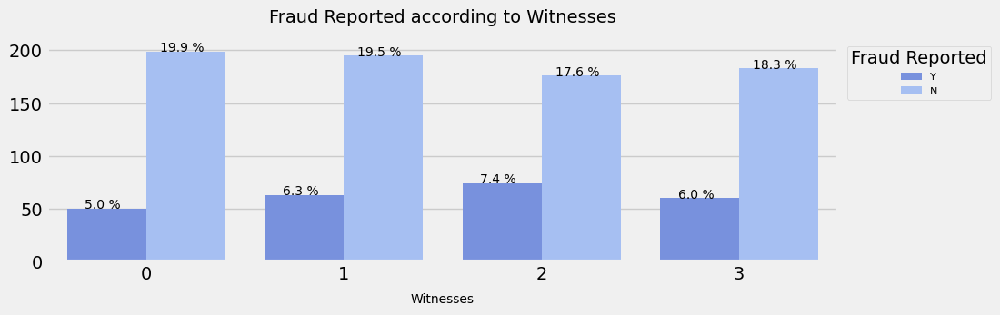

In [156]:
# Compare (20) <witnesses> vs Fraud Reported
col = 'witnesses'
plot_counts_by_fraud_reported(col, xlabel='Witnesses', figsize=(10,3), show_perc=True )

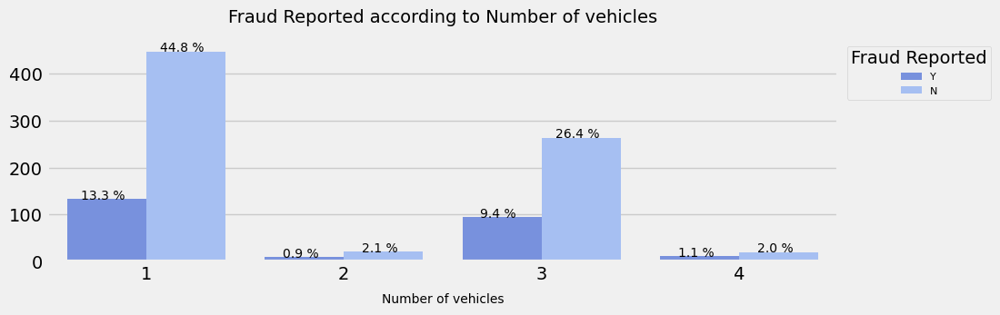

In [157]:
# Compare (21) <number_of_vehicles_involved> vs Fraud Reported
col = 'number_of_vehicles_involved'
plot_counts_by_fraud_reported(col, xlabel='Number of vehicles', figsize=(10,3), show_perc=True )

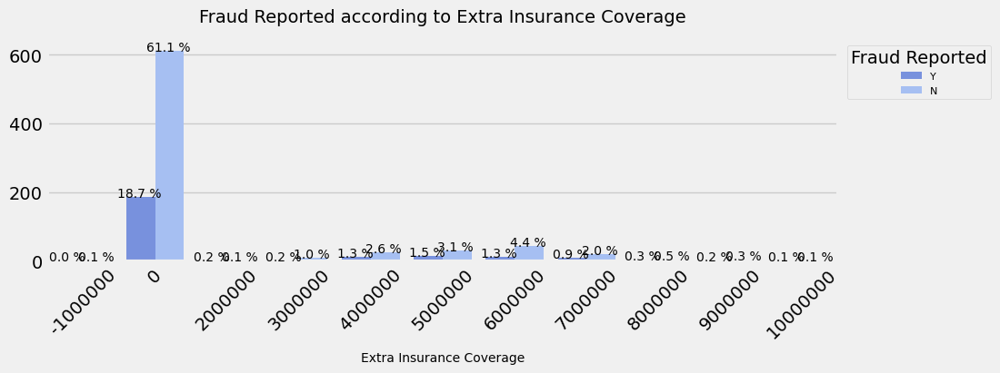

In [161]:
# Compare (22) <umbrella_limit> vs Fraud Reported
col = 'umbrella_limit'
plot_counts_by_fraud_reported(col, xlabel='Extra Insurance Coverage', figsize=(10,3), show_perc=True ,rot=45)

The majority of the samples consist of zero values, with 61.1% representing non-fraudulent claims and 18.7% indcating claims submitted as fraudulent.

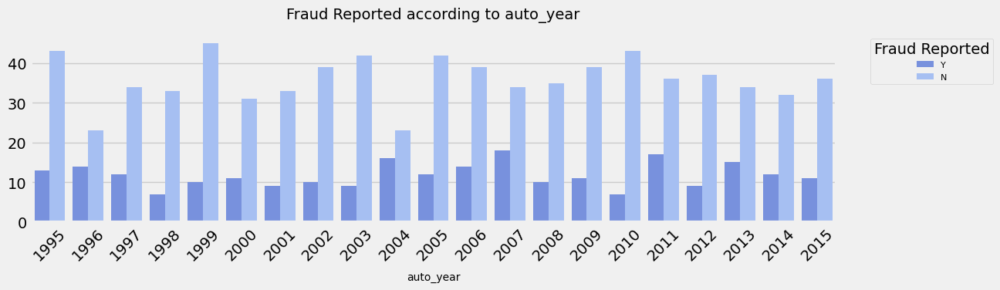

In [159]:
# Compare (23) <auto_year> vs Fraud Reported
col = 'auto_year'
plot_counts_by_fraud_reported(col, xlabel='auto_year', figsize=(12,3), show_perc=False, rot=45 )

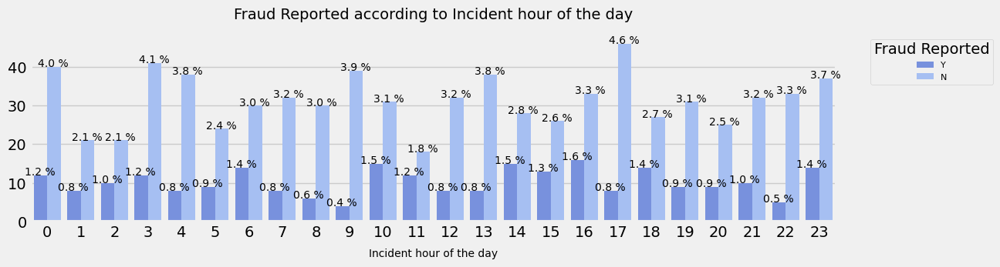

In [162]:
# Compare (24) <incident_hour_of_the_day> vs Fraud Reported
col = 'incident_hour_of_the_day'
plot_counts_by_fraud_reported(col, xlabel='Incident hour of the day', figsize=(12,3), show_perc=True, rot=0 )

The most common time of day for a fraudulent claim to be reported is 4:00 p.m., accounting for 1.6%, followed by 1.5% at 10:00 a.m. and 2:00 p.m. In contrast, non-fraudulent claims were most frequently submitted at 5:00 p.m., representing 4.6%, followed by 3:00 a.m. with 4.1%.

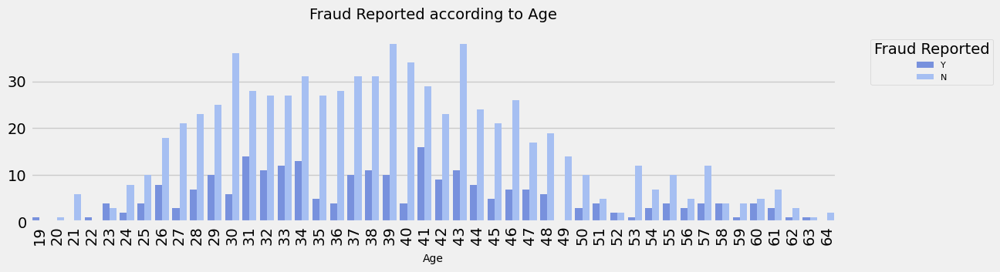

In [163]:
# Compare (25) <age> vs Fraud Reported
col = 'age'
plot_counts_by_fraud_reported(col, xlabel='Age', figsize=(12,3), show_perc=False, rot=90 )

The majority of those insured who submitted a fraudulent claim are 41 or 31 years old

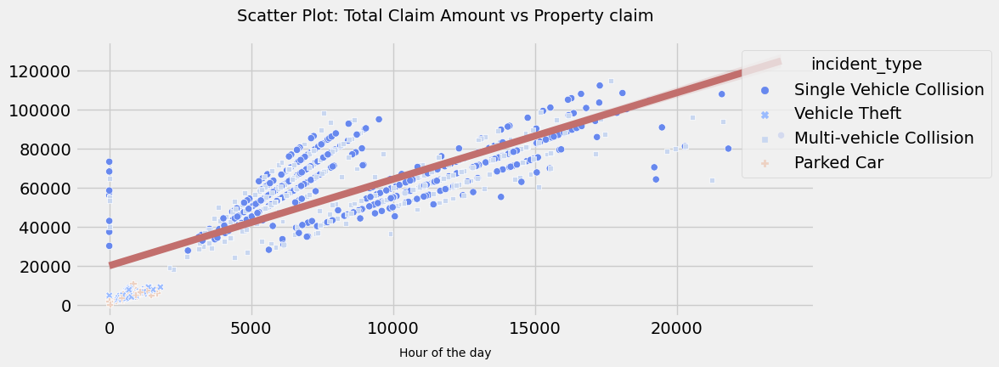

In [165]:
#Relation between Total Claim Amount and the Incident type
colx = 'property_claim'
coly = 'total_claim_amount'
col_hue = 'incident_type'
colors = ['#6e90bf', '#c26f6d']
xlabel, ylabel, title = ['Hour of the day','', f'Scatter Plot: Total Claim Amount vs Property claim']

plt.figure(figsize=(10, 4))
ax = sns.scatterplot(x=colx, y=coly, data=df[[colx,coly, col_hue]], hue=col_hue, style=col_hue)
sns.regplot(x=colx, y=coly, data=df, scatter=False, ax=ax, color=colors[1])

plt.xlabel(xlabel, size=10, labelpad=8)
plt.ylabel(ylabel, size=10, labelpad=8)
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1)).set_title(col_hue)

plt.title(title, size=14, y=1.05);

Seems to be a linear relation between the total claim amount and the property claim.

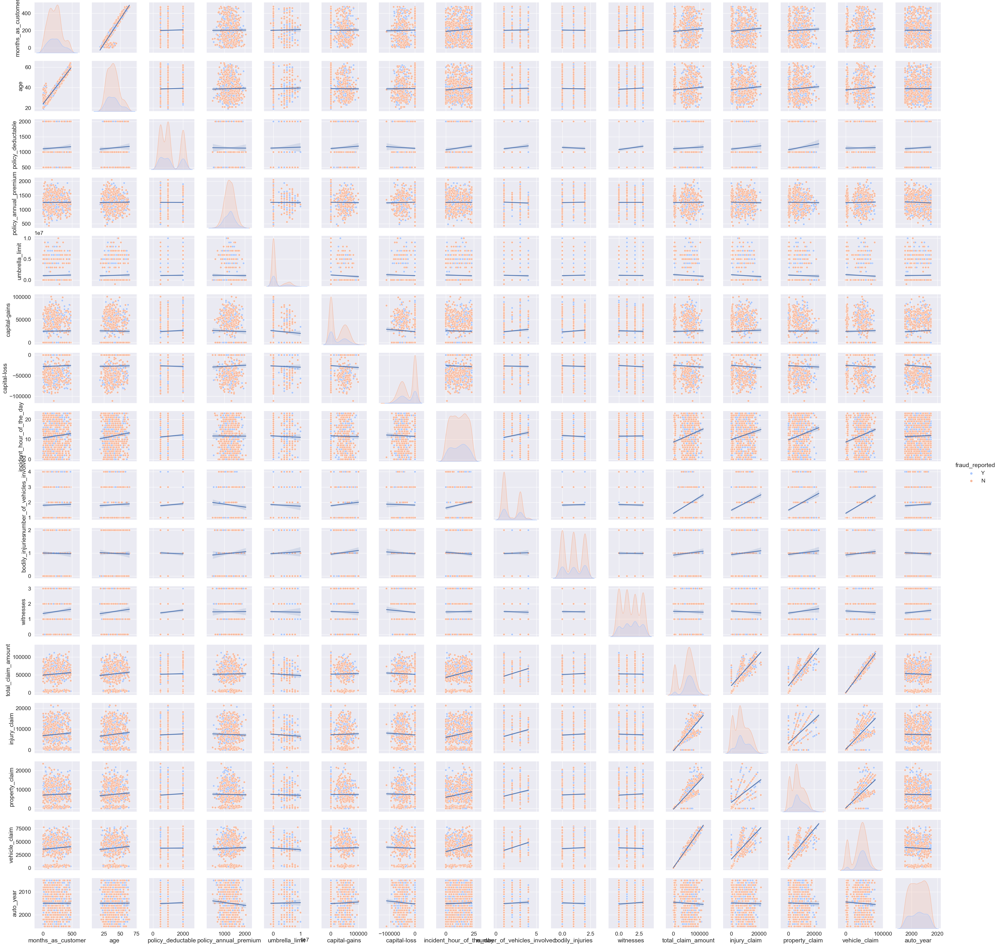

In [170]:
#Multivariate Analysis
#Pairplot
sns.set(font_scale=1.5)  
grid = sns.pairplot(data=df, hue='fraud_reported', palette = "coolwarm")

# Add a regression line for non-diagonal plots
for ax in grid.axes.flat[1:-1]: # first and last axes are not considered
    if ax.get_xlabel() != ax.get_ylabel():
        sns.regplot(data=df, x=ax.get_xlabel(), y=ax.get_ylabel(), scatter=False, ax=ax, color='b')

plt.show()

There is a positive correlation between:

Age and months_as_customer
vehicle_claim, property_claim, injury_claim, and total_claim_amount

In [171]:
#Encoding the Target Variable
df['fraud_reported'].unique()

array(['Y', 'N'], dtype=object)

In [172]:
df['fraud_reported']=df['fraud_reported'].map({'Y':1,'N':0})
df.head()

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,2014-10-17,OH,250/500,1000,1406.91,0,MALE,MD,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,1
1,228,42,2006-06-27,IN,250/500,2000,1197.22,5000000,MALE,MD,...,0,?,5070,780,780,3510,Mercedes,E400,2007,1
2,134,29,2000-09-06,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,0
3,256,41,1990-05-25,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,1
4,228,44,2014-06-06,IL,500/1000,1000,1583.91,6000000,MALE,Associate,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,0


In [179]:
dummies = pd.get_dummies(df[[
    'policy_state', 
    'policy_csl', 
    'insured_sex', 
    'insured_education_level',
    'insured_occupation', 
    'insured_hobbies', 
    'insured_relationship',
    'incident_type', 
    'incident_severity',
    'authorities_contacted', 
    'incident_state', 
    'incident_city',
    'auto_make', 
    'auto_model',
    'incident_hour_of_the_day']])

dummies = dummies.join(df[[
    'collision_type', 
    'property_damage', 
    'police_report_available', 
    "fraud_reported"]])

dummies.head()

,incident_hour_of_the_day,policy_state_IL,policy_state_IN,policy_state_OH,policy_csl_100/300,policy_csl_250/500,policy_csl_500/1000,insured_sex_FEMALE,insured_sex_MALE,insured_education_level_Associate,...,auto_model_TL,auto_model_Tahoe,auto_model_Ultima,auto_model_Wrangler,auto_model_X5,auto_model_X6,collision_type,property_damage,police_report_available,fraud_reported
0,5,False,False,True,False,True,False,False,True,False,...,False,False,False,False,False,False,Side Collision,YES,YES,1
1,8,False,True,False,False,True,False,False,True,False,...,False,False,False,False,False,False,?,?,?,1
2,7,False,False,True,True,False,False,True,False,False,...,False,False,False,False,False,False,Rear Collision,NO,NO,0
3,5,True,False,False,False,True,False,True,False,False,...,False,True,False,False,False,False,Front Collision,?,NO,1
4,20,True,False,False,False,False,True,False,True,True,...,False,False,False,False,False,False,?,NO,NO,0


In [180]:
X = dummies.iloc[:, 0:-1]
y = dummies.iloc[:, -1]

In [181]:
X.head()
y.head()

0    1
1    1
2    0
3    1
4    0
Name: fraud_reported, dtype: int64

In [182]:
X.head()

,incident_hour_of_the_day,policy_state_IL,policy_state_IN,policy_state_OH,policy_csl_100/300,policy_csl_250/500,policy_csl_500/1000,insured_sex_FEMALE,insured_sex_MALE,insured_education_level_Associate,...,auto_model_Silverado,auto_model_TL,auto_model_Tahoe,auto_model_Ultima,auto_model_Wrangler,auto_model_X5,auto_model_X6,collision_type,property_damage,police_report_available
0,5,False,False,True,False,True,False,False,True,False,...,False,False,False,False,False,False,False,Side Collision,YES,YES
1,8,False,True,False,False,True,False,False,True,False,...,False,False,False,False,False,False,False,?,?,?
2,7,False,False,True,True,False,False,True,False,False,...,False,False,False,False,False,False,False,Rear Collision,NO,NO
3,5,True,False,False,False,True,False,True,False,False,...,False,False,True,False,False,False,False,Front Collision,?,NO
4,20,True,False,False,False,False,True,False,True,True,...,False,False,False,False,False,False,False,?,NO,NO


In [183]:
len(X.columns)

138

In [184]:
from sklearn.preprocessing import LabelEncoder
X['collision_en'] = LabelEncoder().fit_transform(dummies['collision_type'])
X[['collision_type', 'collision_en']]

,collision_type,collision_en
0,Side Collision,3
1,?,0
2,Rear Collision,2
3,Front Collision,1
4,?,0
...,...,...
995,Front Collision,1
996,Rear Collision,2
997,Side Collision,3
998,Rear Collision,2


In [185]:
X['property_damage'].replace(to_replace='YES', value=1, inplace=True)
X['property_damage'].replace(to_replace='NO', value=0, inplace=True)
X['property_damage'].replace(to_replace='?', value=0, inplace=True)
X['police_report_available'].replace(to_replace='YES', value=1, inplace=True)
X['police_report_available'].replace(to_replace='NO', value=0, inplace=True)
X['police_report_available'].replace(to_replace='?', value=0, inplace=True)

X.head(10) 

,incident_hour_of_the_day,policy_state_IL,policy_state_IN,policy_state_OH,policy_csl_100/300,policy_csl_250/500,policy_csl_500/1000,insured_sex_FEMALE,insured_sex_MALE,insured_education_level_Associate,...,auto_model_TL,auto_model_Tahoe,auto_model_Ultima,auto_model_Wrangler,auto_model_X5,auto_model_X6,collision_type,property_damage,police_report_available,collision_en
0,5,False,False,True,False,True,False,False,True,False,...,False,False,False,False,False,False,Side Collision,1,1,3
1,8,False,True,False,False,True,False,False,True,False,...,False,False,False,False,False,False,?,0,0,0
2,7,False,False,True,True,False,False,True,False,False,...,False,False,False,False,False,False,Rear Collision,0,0,2
3,5,True,False,False,False,True,False,True,False,False,...,False,True,False,False,False,False,Front Collision,0,0,1
4,20,True,False,False,False,False,True,False,True,True,...,False,False,False,False,False,False,?,0,0,0
5,19,False,False,True,False,True,False,True,False,False,...,False,False,False,False,False,False,Rear Collision,0,0,2
6,0,False,True,False,False,True,False,False,True,False,...,False,False,False,False,False,False,Front Collision,0,0,1
7,23,True,False,False,True,False,False,False,True,True,...,False,False,False,False,False,False,Front Collision,0,1,1
8,21,True,False,False,True,False,False,True,False,False,...,False,False,False,False,False,False,Front Collision,0,1,1
9,14,True,False,False,True,False,False,False,True,False,...,False,False,False,False,False,False,Rear Collision,0,0,2


In [190]:
X = X.drop(columns = ['collision_type'])
X.columns

Index(['incident_hour_of_the_day', 'policy_state_IL', 'policy_state_IN',
       'policy_state_OH', 'policy_csl_100/300', 'policy_csl_250/500',
       'policy_csl_500/1000', 'insured_sex_FEMALE', 'insured_sex_MALE',
       'insured_education_level_Associate',
       ...
       'auto_model_Silverado', 'auto_model_TL', 'auto_model_Tahoe',
       'auto_model_Ultima', 'auto_model_Wrangler', 'auto_model_X5',
       'auto_model_X6', 'property_damage', 'police_report_available',
       'collision_en'],
      dtype='object', length=138)

In [191]:
df_process=X
df_process

,incident_hour_of_the_day,policy_state_IL,policy_state_IN,policy_state_OH,policy_csl_100/300,policy_csl_250/500,policy_csl_500/1000,insured_sex_FEMALE,insured_sex_MALE,insured_education_level_Associate,...,auto_model_Silverado,auto_model_TL,auto_model_Tahoe,auto_model_Ultima,auto_model_Wrangler,auto_model_X5,auto_model_X6,property_damage,police_report_available,collision_en
0,5,False,False,True,False,True,False,False,True,False,...,False,False,False,False,False,False,False,1,1,3
1,8,False,True,False,False,True,False,False,True,False,...,False,False,False,False,False,False,False,0,0,0
2,7,False,False,True,True,False,False,True,False,False,...,False,False,False,False,False,False,False,0,0,2
3,5,True,False,False,False,True,False,True,False,False,...,False,False,True,False,False,False,False,0,0,1
4,20,True,False,False,False,False,True,False,True,True,...,False,False,False,False,False,False,False,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,20,False,False,True,False,False,True,True,False,False,...,False,False,False,False,False,False,False,1,0,1
996,23,True,False,False,True,False,False,True,False,False,...,False,False,False,False,False,False,False,1,0,2
997,4,False,False,True,False,True,False,True,False,False,...,False,False,False,False,False,False,False,0,1,3
998,2,True,False,False,False,False,True,False,True,True,...,False,False,False,False,False,False,False,0,1,2


In [201]:
df_process.info

<bound method DataFrame.info of      incident_hour_of_the_day  policy_state_IL  policy_state_IN  \
0                           5            False            False   
1                           8            False             True   
2                           7            False            False   
3                           5             True            False   
4                          20             True            False   
..                        ...              ...              ...   
995                        20            False            False   
996                        23             True            False   
997                         4            False            False   
998                         2             True            False   
999                         6            False            False   

     policy_state_OH  policy_csl_100/300  policy_csl_250/500  \
0               True               False                True   
1              False               

In [202]:
# Checking the skewness in the data
df_skew = df_process.skew().sort_values(ascending=False).to_frame("Skew")
df_skew

,Skew
auto_model_RSX,8.977035
auto_model_Accord,8.611542
auto_model_M5,7.992087
auto_model_X6,7.726272
auto_model_C300,7.261682
...,...
incident_type_Multi-vehicle Collision,0.328831
insured_sex_MALE,0.148630
incident_hour_of_the_day,-0.035584
insured_sex_FEMALE,-0.148630


We dont see much about the skewness to be taken care off, even outliers were not many which will deviate the prediction, so lets continue with model building.

In [203]:
X.columns

Index(['incident_hour_of_the_day', 'policy_state_IL', 'policy_state_IN',
       'policy_state_OH', 'policy_csl_100/300', 'policy_csl_250/500',
       'policy_csl_500/1000', 'insured_sex_FEMALE', 'insured_sex_MALE',
       'insured_education_level_Associate',
       ...
       'auto_model_Silverado', 'auto_model_TL', 'auto_model_Tahoe',
       'auto_model_Ultima', 'auto_model_Wrangler', 'auto_model_X5',
       'auto_model_X6', 'property_damage', 'police_report_available',
       'collision_en'],
      dtype='object', length=138)

In [206]:
y.shape

(1000,)

In [207]:
#Scaling
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# Scaling the data 
x = pd.DataFrame(scaler.fit_transform(X), columns = X.columns)

display(x.head())

,incident_hour_of_the_day,policy_state_IL,policy_state_IN,policy_state_OH,policy_csl_100/300,policy_csl_250/500,policy_csl_500/1000,insured_sex_FEMALE,insured_sex_MALE,insured_education_level_Associate,...,auto_model_Silverado,auto_model_TL,auto_model_Tahoe,auto_model_Ultima,auto_model_Wrangler,auto_model_X5,auto_model_X6,property_damage,police_report_available,collision_en
0,-0.956261,-0.714545,-0.670280,1.356801,-0.732187,1.359780,-0.654654,-1.076953,1.076953,-0.411814,...,-0.149983,-0.142857,-0.156813,-0.153432,-0.209383,-0.153432,-0.127515,1.520282,1.478078,1.254675
1,-0.524475,-0.714545,1.491914,-0.737028,-0.732187,1.359780,-0.654654,-1.076953,1.076953,-0.411814,...,-0.149983,-0.142857,-0.156813,-0.153432,-0.209383,-0.153432,-0.127515,-0.657773,-0.676554,-1.566933
2,-0.668404,-0.714545,-0.670280,1.356801,1.365771,-0.735413,-0.654654,0.928546,-0.928546,-0.411814,...,-0.149983,-0.142857,-0.156813,-0.153432,-0.209383,-0.153432,-0.127515,-0.657773,-0.676554,0.314139
3,-0.956261,1.399493,-0.670280,-0.737028,-0.732187,1.359780,-0.654654,0.928546,-0.928546,-0.411814,...,-0.149983,-0.142857,6.377042,-0.153432,-0.209383,-0.153432,-0.127515,-0.657773,-0.676554,-0.626397
4,1.202666,1.399493,-0.670280,-0.737028,-0.732187,-0.735413,1.527525,-1.076953,1.076953,2.428282,...,-0.149983,-0.142857,-0.156813,-0.153432,-0.209383,-0.153432,-0.127515,-0.657773,-0.676554,-1.566933


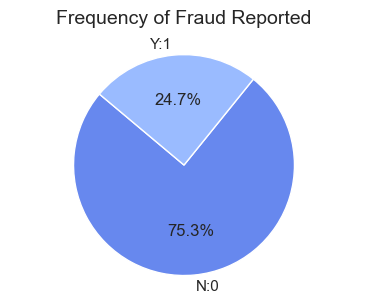

In [211]:
#Balancing the dataset
# Count the frequencies of target
target_counts = y.value_counts()

# Create a pie plot
sns.set(font_scale=1.0)
sns.set_palette('coolwarm')
plt.figure(figsize=(4, 3))
plt.pie(target_counts, labels=['N:0','Y:1'], autopct='%1.1f%%', startangle=140)

plt.title("Frequency of Fraud Reported", size=14, y=1.05)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [212]:
# Oversampling the data
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x1, y1 = SM.fit_resample(X, y)

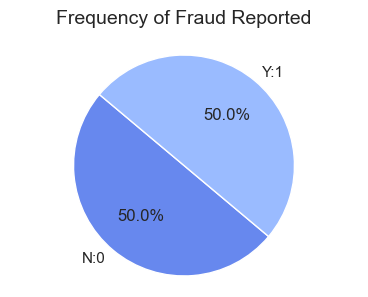

In [213]:
# Count the frequencies of target
target_counts = y1.value_counts()

# Create a pie plot
plt.figure(figsize=(4, 3))
plt.pie(target_counts, labels=['N:0','Y:1'], autopct='%1.1f%%', startangle=140)

plt.title("Frequency of Fraud Reported", size=14, y=1.05)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [214]:
X = x1
Y = y1

In [215]:
#Modelling
#Finding the best Random state
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

def find_best_random_state(model, x, y):
    best_acc = 0
    best_random_state = 0

    for i in range(1,200):
        x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=i)
        model.fit(x_train, y_train)
        y_pred = model.predict(x_test)
        acc = accuracy_score(y_test, y_pred)
        if acc > best_acc:
            best_acc = acc
            best_random_state = i
            
    return [best_random_state, best_acc]

In [216]:
%%time
# Build the model
model = RandomForestClassifier()
random_state, acc = find_best_random_state(model, X, Y) 
print(f"Best accuracy is {round(acc,4)} at random_state {random_state}")

Best accuracy is 0.9204 at random_state 93
CPU times: user 17.9 s, sys: 49.4 ms, total: 18 s
Wall time: 18 s


In [217]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=random_state)
print("x_train shape: ", x_train.shape)
print("x_test shape:  ", x_test.shape)
print("y_train shape: ", y_train.shape)
print("y_test shape:  ", y_test.shape)

x_train shape:  (1054, 138)
x_test shape:   (452, 138)
y_train shape:  (1054,)
y_test shape:   (452,)


In [218]:
#Classification Algorithm
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier 
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score, StratifiedKFold

In [219]:
# Functions 
def calc_accuracy(model, id_model):
    ''' Calculate the accuracy of the model. Return the accuracy, training accuracy, and the predicted values.'''
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    
    acc = accuracy_score(y_test, y_pred)
    acc_train = model.score(x_train, y_train)
    
    print(f"\nModel: {id_model}")
    print(f"Confusion matrix: \n {confusion_matrix(y_test, y_pred)}")
    print(f"Classification report: \n {classification_report(y_test, y_pred)}" )
    print(f"Training Accuracy using {id_model} is {acc_train*100.0:.2f}%")
    print(f"The accuracy score using {id_model} is {round(acc*100.0, 2)}%")
    
    return [acc, acc_train, y_pred]

In [220]:
models = {'RandomForestClassifier' : RandomForestClassifier(), 
          'ExtraTreesClassifier': ExtraTreesClassifier(),
          'LogisticRegression': LogisticRegression(),
          'SVC': SVC(),
          'GradientBoostingClassifier': GradientBoostingClassifier(), 
          'AdaBoostClassifier': AdaBoostClassifier(), 
          'BaggingClassifier': BaggingClassifier()}

# Setting up for saving the results of each model
df_model_accuracy = pd.DataFrame(columns=['id','Model','Training Accuracy','Model Accuracy Score'])
y_pred = {}


In [230]:
%%time
id_model = 'RandomForestClassifier'
model = models[id_model]
RFC=RandomForestClassifier()
RFC.fit(x_train,y_train)

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)


print("Cross_Validaton_Score",cross_val_score(RFC,X,Y,cv=5).mean())



Model: RandomForestClassifier
Confusion matrix: 
 [[206  16]
 [ 24 206]]
Classification report: 
               precision    recall  f1-score   support

           0       0.90      0.93      0.91       222
           1       0.93      0.90      0.91       230

    accuracy                           0.91       452
   macro avg       0.91      0.91      0.91       452
weighted avg       0.91      0.91      0.91       452

Training Accuracy using RandomForestClassifier is 100.00%
The accuracy score using RandomForestClassifier is 91.15%
Cross_Validaton_Score 0.876581373347121
CPU times: user 677 ms, sys: 6.25 ms, total: 683 ms
Wall time: 682 ms


In [231]:
%%time
id_model = 'ExtraTreesClassifier'
model = models[id_model]
ETC=ExtraTreesClassifier()
ETC.fit(x_train,y_train)
# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)

print("Cross_Validaton_Score",cross_val_score(ETC,X,Y,cv=5).mean())


Model: ExtraTreesClassifier
Confusion matrix: 
 [[208  14]
 [ 25 205]]
Classification report: 
               precision    recall  f1-score   support

           0       0.89      0.94      0.91       222
           1       0.94      0.89      0.91       230

    accuracy                           0.91       452
   macro avg       0.91      0.91      0.91       452
weighted avg       0.91      0.91      0.91       452

Training Accuracy using ExtraTreesClassifier is 100.00%
The accuracy score using ExtraTreesClassifier is 91.37%
Cross_Validaton_Score 0.8712811599304746
CPU times: user 758 ms, sys: 8.94 ms, total: 767 ms
Wall time: 767 ms


In [224]:
%%time

id_model = 'LogisticRegression'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)



Model: LogisticRegression
Confusion matrix: 
 [[206  16]
 [ 25 205]]
Classification report: 
               precision    recall  f1-score   support

           0       0.89      0.93      0.91       222
           1       0.93      0.89      0.91       230

    accuracy                           0.91       452
   macro avg       0.91      0.91      0.91       452
weighted avg       0.91      0.91      0.91       452

Training Accuracy using LogisticRegression is 92.88%
The accuracy score using LogisticRegression is 90.93%
CPU times: user 1.05 s, sys: 220 ms, total: 1.27 s
Wall time: 213 ms


In [225]:
%%time

id_model = 'SVC'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)


Model: SVC
Confusion matrix: 
 [[207  15]
 [ 36 194]]
Classification report: 
               precision    recall  f1-score   support

           0       0.85      0.93      0.89       222
           1       0.93      0.84      0.88       230

    accuracy                           0.89       452
   macro avg       0.89      0.89      0.89       452
weighted avg       0.89      0.89      0.89       452

Training Accuracy using SVC is 88.99%
The accuracy score using SVC is 88.72%
CPU times: user 204 ms, sys: 3.06 ms, total: 207 ms
Wall time: 206 ms


In [226]:
%%time

id_model = 'GradientBoostingClassifier'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)


Model: GradientBoostingClassifier
Confusion matrix: 
 [[208  14]
 [ 27 203]]
Classification report: 
               precision    recall  f1-score   support

           0       0.89      0.94      0.91       222
           1       0.94      0.88      0.91       230

    accuracy                           0.91       452
   macro avg       0.91      0.91      0.91       452
weighted avg       0.91      0.91      0.91       452

Training Accuracy using GradientBoostingClassifier is 95.07%
The accuracy score using GradientBoostingClassifier is 90.93%
CPU times: user 179 ms, sys: 3.15 ms, total: 182 ms
Wall time: 181 ms


In [227]:
%%time

id_model = 'AdaBoostClassifier'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)


Model: AdaBoostClassifier
Confusion matrix: 
 [[197  25]
 [ 32 198]]
Classification report: 
               precision    recall  f1-score   support

           0       0.86      0.89      0.87       222
           1       0.89      0.86      0.87       230

    accuracy                           0.87       452
   macro avg       0.87      0.87      0.87       452
weighted avg       0.87      0.87      0.87       452

Training Accuracy using AdaBoostClassifier is 88.71%
The accuracy score using AdaBoostClassifier is 87.39%
CPU times: user 87 ms, sys: 3.88 ms, total: 90.9 ms
Wall time: 88.6 ms


In [228]:
%%time

id_model = 'BaggingClassifier'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)


Model: BaggingClassifier
Confusion matrix: 
 [[206  16]
 [ 27 203]]
Classification report: 
               precision    recall  f1-score   support

           0       0.88      0.93      0.91       222
           1       0.93      0.88      0.90       230

    accuracy                           0.90       452
   macro avg       0.91      0.91      0.90       452
weighted avg       0.91      0.90      0.90       452

Training Accuracy using BaggingClassifier is 99.34%
The accuracy score using BaggingClassifier is 90.49%
CPU times: user 70.6 ms, sys: 3.43 ms, total: 74 ms
Wall time: 72.6 ms


We see that Random forest Classifier and Extra trees classifier have the accuracy score of 91.12% and 91.37%. When we see the Cross Validation Score we Extratrees classifier difference is .04 when compared to Random forest Classifier of 0.03.
On the analysis of the results of various models, Extra Trees Classifier tends to be best model. 

In [232]:
#Hyperparameter Tuning
random_state

93

In [233]:
model=ExtraTreesClassifier()
model.get_params()

{'bootstrap': False,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [234]:
# ExtraTreesClassifier
from sklearn.model_selection import RandomizedSearchCV

param_grid = {
             'bootstrap':[True, False],
             'criterion':['gini','entropy'],
             'min_samples_split': np.arange(1, 3),  # Vary the minimum samples required to split
             'min_samples_leaf': np.arange(1, 3),  # Vary the minimum samples required for a leaf
             'n_estimators': np.arange(100, 310, 10),  # Vary the number of trees
             'max_depth': [None] + list(np.arange(80, 110, 10)),  # Vary the maximum depth of trees
             'max_features': ['auto', 'sqrt', 'log2'],
             'random_state': [random_state, 50, 500, 1000],
             'n_jobs': [-1, 0, 1]
             }

# Build the model 
model = ExtraTreesClassifier()

In [235]:
%%time 

# Perform search with cross validation
# Create RandomizedSearchCV
random_search = RandomizedSearchCV(model, param_distributions=param_grid, 
                                   n_iter=10, scoring='accuracy', cv=3, 
                                   random_state=random_state, n_jobs=-1)
# Fit the model 
random_search.fit(x_train, y_train)

CPU times: user 290 ms, sys: 129 ms, total: 418 ms
Wall time: 1.73 s


RandomizedSearchCV(cv=3, estimator=ExtraTreesClassifier(), n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [None, 80, 90, 100],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': array([1, 2]),
                                        'min_samples_split': array([1, 2]),
                                        'n_estimators': array([100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220,
       230, 240, 250, 260, 270, 280, 290, 300]),
                                        'n_jobs': [-1, 0, 1],
                                        'random_state': [93, 50, 500, 1000]},
                   random_state=93, scoring='accuracy')

In [236]:
# Get the best hyperparameters and the best model
best_params = random_search.best_params_
best_model = random_search.best_estimator_

print("Best Parameters for ExtraTreesClassifier model:")
display(best_params)

Best Parameters for ExtraTreesClassifier model:


{'random_state': 93,
 'n_jobs': -1,
 'n_estimators': 190,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': None,
 'criterion': 'entropy',
 'bootstrap': True}

In [237]:
best_model

ExtraTreesClassifier(bootstrap=True, criterion='entropy', n_estimators=190,
                     n_jobs=-1, random_state=93)

In [238]:
# Create the model with the best parameters
best_model = ExtraTreesClassifier (criterion = 'gini',
                                   bootstrap = False,
                                   max_depth = 90,
                                   max_features = 'sqrt',
                                   min_samples_split = 2,
                                   min_samples_leaf = 2,
                                   n_estimators = 270,
                                   n_jobs = -1, 
                                   random_state = 500)

best_model.fit(x_train, y_train)
y_pred = best_model.predict(x_test)

# Check the accuracy
acc = accuracy_score(y_test, y_pred)
print(f"accuracy_score: {round(acc*100,2)}%")

accuracy_score: 90.93%


In [239]:
# Create the model with the best parameters
best_model = ExtraTreesClassifier (criterion = 'gini',
                                   bootstrap = False,
                                   max_depth = 90,
                                   max_features = 'sqrt',
                                   min_samples_split = 2,
                                   min_samples_leaf = 1,
                                   n_estimators = 270,
                                   n_jobs = -1, 
                                   random_state = 500)

best_model.fit(x_train, y_train)
y_pred = best_model.predict(x_test)

# Check the accuracy
acc = accuracy_score(y_test, y_pred)
print(f"accuracy_score: {round(acc*100,2)}%")

accuracy_score: 91.81%


In [240]:
# Saving the model using .pkl
import joblib
joblib.dump(best_model, "fraud_detection_model.pkl")

['fraud_detection_model.pkl']

In [242]:
# Lets load the saved model and get the predictions
model = joblib.load("fraud_detection_model.pkl")

# Prediction
prediction = model.predict(x_test)

# Accuracy score of the prediction with the model selected
print(f"Accuracy score: {accuracy_score(y_test, prediction)*100:.3f} %")

# Dataframe to compare the predicted values vs the original values
df_result = pd.DataFrame()
df_result['Predicted'] = prediction
df_result['Original'] = np.array(y_test)
df_result.T

Accuracy score: 91.814 %


,0,1,2,3,4,5,6,7,8,9,...,442,443,444,445,446,447,448,449,450,451
Predicted,0,0,0,0,1,0,1,0,1,1,...,0,0,1,1,1,1,1,0,0,1
Original,1,0,0,0,1,1,1,0,1,1,...,0,0,1,1,1,1,1,0,0,1


These are the predicted values in the fraction of the dataset we appart for testing to compare the prediction with accuracy of 91.814%.